# HRD classification of scNanoSeq cells (HRDscout)

Trains a Random Forest on PCAWG breast mutation catalogues (SBS96 + ID83) that are multinomially down-sampled to single-cell mutation burdens, then scores each scNanoSeq cell for probability of belonging to the HRDetect-high class.

- **Classifier:** `RandomForestClassifier(n_estimators=100, random_state=41)`
- **Features (179):** 96 SBS + 83 ID83 channels.
- **Labels:** `1` if the PCAWG sample's `hrdetect.class == "HRDetect_high"`, else `0`.
- **Training set:** PCAWG breast samples with `50 < indel_burden < 5000` and `SNV_burden < 20000`, down-sampled at the ratios in `DOWNSAMPLING_RATIOS`.
- **Validation:** 10-fold CV; per-ratio ROC gives the operating threshold at FPR = 0.02.
- The published model, feature order, and labeled training matrix are loaded from `data/Fig6_scNanoSeq_HRD_classification/` (not retrained).

All inputs live in `data/Fig6_scNanoSeq_HRD_classification/`; the scNanoSeq feature matrix is reindexed to the training feature order before scoring.

## 1. Imports and paths

In [1]:
import pandas as pd

import matplotlib as mpl
import logging
from io import StringIO
from tqdm import tqdm
%matplotlib inline

# Set default spine and tick width
mpl.rcParams['axes.linewidth'] = 0.5
mpl.rcParams['xtick.major.width'] = 0.5
mpl.rcParams['ytick.major.width'] = 0.5
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['figure.dpi'] = 600

logging.getLogger("matplotlib").setLevel(logging.ERROR)

def set_mpl_style():
    """Apply custom matplotlib style settings."""
    mpl.rcParams.update({
        'pdf.fonttype': 42,
        'font.family': 'Sans',
        'font.size': 8,
        'text.color': 'black',
        'axes.labelcolor': 'black',
        'axes.spines.top': False,
        'axes.spines.right': False,
        'axes.linewidth': 0.25,
        'axes.edgecolor': 'black',
        'xtick.color': 'black',
        'ytick.color': 'black',
        'xtick.direction': 'out',
        'ytick.direction': 'out',
        'xtick.major.width': 0.25,
        'ytick.major.width': 0.25,
        'xtick.major.size': 5,
        'ytick.major.size': 5,
        'xtick.labelsize': 7,
        'ytick.labelsize': 7,
    })

set_mpl_style()


In [2]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import iqr
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import roc_curve, auc, confusion_matrix
import joblib

plt.rcParams.update({"font.size": 14})
mpl.rcParams["pdf.fonttype"] = 42  # editable text in Illustrator

# ---- Paths (edit these) -----------------------------------------------------
SNV_CATALOG_PCAWG   = "data/Fig6_scNanoSeq_HRD_classification/snv_catalogue_combined.csv"
INDEL_CATALOG_PCAWG = "data/Fig6_scNanoSeq_HRD_classification/indel_catalogue_combined.csv"
HRDETECT_LABELS     = "data/Fig6_scNanoSeq_HRD_classification/breast.labels.250227.csv"

# scNanoSeq feature matrices (already generated upstream from the VCFs)
SNV_CATALOG_SCNANO   = "data/Fig6_scNanoSeq_HRD_classification/snv_catalogue_scNanoSeq.csv"
INDEL_CATALOG_SCNANO = "data/Fig6_scNanoSeq_HRD_classification/indel_catalogue_scNanoSeq.csv"

# Sample-id mapping for plotting
METADATA_V2 = "data/Fig6_scNanoSeq_HRD_classification/scNanoSeq_metadata_v2.csv"

# Output directory
OUTDIR = "../output/Fig6_scNanoSeq_HRD_classification"
os.makedirs(OUTDIR, exist_ok=True)

# ---- Training-set composition ----------------------------------------------
# This is the list that produced the per-suffix ROC reported in the paper.
# Each entry is a downsampling ratio (target_burden = total_burden / ratio).
# Including each ratio multiple times boosts the synthetic sample count at that burden.
DOWNSAMPLING_RATIOS = [10, 10, 10, 20, 20, 20, 30, 30, 40, 40,
                       50, 50, 100, 100, 100, 120, 120, 120, 150, 150, 150]

# ---- Sample filters (PCAWG) -------------------------------------------------
MIN_INDEL = 50
MAX_INDEL = 5000
MAX_SNV   = 20000

# ---- RF hyperparameters ----------------------------------------------------
RF_KWARGS = dict(n_estimators=100, random_state=41)
CV_FOLDS  = 10


## 2. Load the cached training matrix and HRDscout model

The published HRDscout RandomForest, its feature order, and the down-sampled labeled training matrix are loaded from `data/` — the model is **not** retrained here.

In [3]:
labeled_matrix = pd.read_csv("data/Fig6_scNanoSeq_HRD_classification/LABELED_synthetic_training_matrix.csv", index_col=0)
rf_classifier  = joblib.load("data/Fig6_scNanoSeq_HRD_classification/rf_classifier_HRDetect.joblib")
FEATURE_COLS   = joblib.load("data/Fig6_scNanoSeq_HRD_classification/rf_classifier_HRDetect.features.joblib")

print(f"Training matrix: {labeled_matrix.shape[0]} synthetic samples x {labeled_matrix.shape[1] - 1} features")
print(f"Loaded model: {type(rf_classifier).__name__}, {rf_classifier.n_estimators} trees, "
      f"{len(FEATURE_COLS)} features")
labeled_matrix.head(3)

Training matrix: 15435 synthetic samples x 179 features
Loaded model: RandomForestClassifier, 100 trees, 179 features


,A[C>A]A,A[C>A]C,A[C>A]G,A[C>A]T,C[C>A]A,C[C>A]C,C[C>A]G,C[C>A]T,G[C>A]A,G[C>A]C,...,3:Del:M:2,4:Del:M:1,4:Del:M:2,4:Del:M:3,5:Del:M:1,5:Del:M:2,5:Del:M:3,5:Del:M:4,5:Del:M:5,HRDetect_binary
PD3989a_10_1,4,4,0,2,2,2,0,3,6,1,...,1,0,1,0,0,0,0,0,0,0
PD4069a_10_1,5,3,0,4,6,3,1,1,6,4,...,0,0,1,0,1,0,0,0,0,0
PD4076a_10_1,2,5,0,3,3,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0


In [4]:
def describe_training_set(labeled_matrix, snv_path=SNV_CATALOG_PCAWG,
                          indel_path=INDEL_CATALOG_PCAWG,
                          min_indel=MIN_INDEL, max_indel=MAX_INDEL, max_snv=MAX_SNV):
    """Print a structured summary of what went into the HRDscout training set."""
    # ---- Source cohort (before any filtering) ----
    snv_raw   = pd.read_csv(snv_path,   index_col=0)
    indel_raw = pd.read_csv(indel_path, index_col=0)
    n_raw_samples = snv_raw.shape[1]

    # ---- Filters ----
    id_tot, snv_tot = indel_raw.sum(axis=0), snv_raw.sum(axis=0)
    valid = (id_tot > min_indel) & (snv_tot < max_snv) & (id_tot < max_indel)
    n_kept = int(valid.sum())
    n_drop = int((~valid).sum())

    # ---- Labels ----
    meta = pd.read_csv(HRDETECT_LABELS)
    meta["HRDetect_binary"] = (meta["hrdetect.class"] == "HRDetect_high").astype(int)
    label_map = meta.set_index("Sample")["HRDetect_binary"].to_dict()
    kept_samples = snv_raw.columns[valid]
    kept_labels  = pd.Series([label_map.get(s, np.nan) for s in kept_samples],
                             index=kept_samples)
    n_unlabeled = int(kept_labels.isna().sum())
    n_pos_src   = int((kept_labels == 1).sum())
    n_neg_src   = int((kept_labels == 0).sum())

    # ---- Synthetic training matrix ----
    suffix = np.array([int(idx.split("_")[1]) for idx in labeled_matrix.index])
    by_ratio = (pd.DataFrame({"ratio": suffix,
                              "label": labeled_matrix["HRDetect_binary"].values})
                  .groupby("ratio")
                  .agg(n_total=("label", "size"),
                       n_positive=("label", "sum"),
                       n_negative=("label", lambda x: (x == 0).sum()),
                       prevalence=("label", "mean"))
                  .reset_index())

    print("=" * 70)
    print("HRDscout training set composition")
    print("=" * 70)
    print(f"\nSource cohort (PCAWG breast WGS catalogue)")
    print(f"  raw samples in catalogue ...................... {n_raw_samples}")
    print(f"  excluded by burden filter ..................... {n_drop}")
    print(f"    (filter: {min_indel} < indels < {max_indel}, SNVs < {max_snv})")
    print(f"  retained samples .............................. {n_kept}")
    print(f"  retained samples without HRDetect label ....... {n_unlabeled}")
    print(f"     (these are treated as HRDetect low/mid)")
    print(f"  HRDetect-high (positives) ..................... {n_pos_src}")
    print(f"  HRDetect low/mid (negatives) .................. {n_neg_src + n_unlabeled}")
    print(f"  source-cohort positive prevalence ............. "
          f"{n_pos_src / (n_pos_src + n_neg_src + n_unlabeled):.3f}")

    print(f"\nDown-sampling ratios used: {sorted(set(suffix.tolist()))}")
    print(f"Repeats per ratio in list: "
          f"{dict(pd.Series(DOWNSAMPLING_RATIOS).value_counts().sort_index())}")

    print(f"\nSynthetic training matrix")
    print(f"  total synthetic samples ....................... {labeled_matrix.shape[0]}")
    print(f"  features (SBS96 + ID83) ....................... "
          f"{labeled_matrix.shape[1] - 1}")
    print(f"  overall positive prevalence ................... "
          f"{labeled_matrix['HRDetect_binary'].mean():.3f}")
    print()
    print("Per-ratio breakdown:")
    print(by_ratio.to_string(index=False))
    return by_ratio

training_breakdown = describe_training_set(labeled_matrix)


HRDscout training set composition

Source cohort (PCAWG breast WGS catalogue)
  raw samples in catalogue ...................... 812
  excluded by burden filter ..................... 77
    (filter: 50 < indels < 5000, SNVs < 20000)
  retained samples .............................. 735
  retained samples without HRDetect label ....... 0
     (these are treated as HRDetect low/mid)
  HRDetect-high (positives) ..................... 273
  HRDetect low/mid (negatives) .................. 462
  source-cohort positive prevalence ............. 0.371

Down-sampling ratios used: [10, 20, 30, 40, 50, 100, 120, 150]
Repeats per ratio in list: {10: np.int64(3), 20: np.int64(3), 30: np.int64(2), 40: np.int64(2), 50: np.int64(2), 100: np.int64(3), 120: np.int64(3), 150: np.int64(3)}

Synthetic training matrix
  total synthetic samples ....................... 15435
  features (SBS96 + ID83) ....................... 179
  overall positive prevalence ................... 0.371

Per-ratio breakdown:
 ratio 

## 4. Report per-ratio operating points

10-fold CV predicted probabilities give the ROC/PR evaluation and the operating threshold at FPR = 0.02 per burden regime. This is evaluation only — the deployed classifier is the model loaded above, not retrained.

In [5]:
X = labeled_matrix.drop(columns=["HRDetect_binary"])[FEATURE_COLS]
y = labeled_matrix["HRDetect_binary"]

# 10-fold CV metrics for the ROC/PR evaluation panels below.
# (Evaluation only — the deployed classifier is the loaded model, not retrained.)
cv_accuracy = cross_val_score(rf_classifier, X, y, cv=CV_FOLDS, scoring="accuracy")
y_pred_proba_cv = cross_val_predict(rf_classifier, X, y, cv=CV_FOLDS, method="predict_proba")[:, 1]
print(f"10-fold CV accuracy: mean={cv_accuracy.mean():.4f}, std={cv_accuracy.std():.4f}")

10-fold CV accuracy: mean=0.9189, std=0.0282


### 4a. Per-suffix (per-ratio) ROC — Figure 2 in the paper

This is the plot that gives the threshold table you'll quote.
At a fixed FPR of 0.02 we read off the TPR and the probability threshold from each curve.


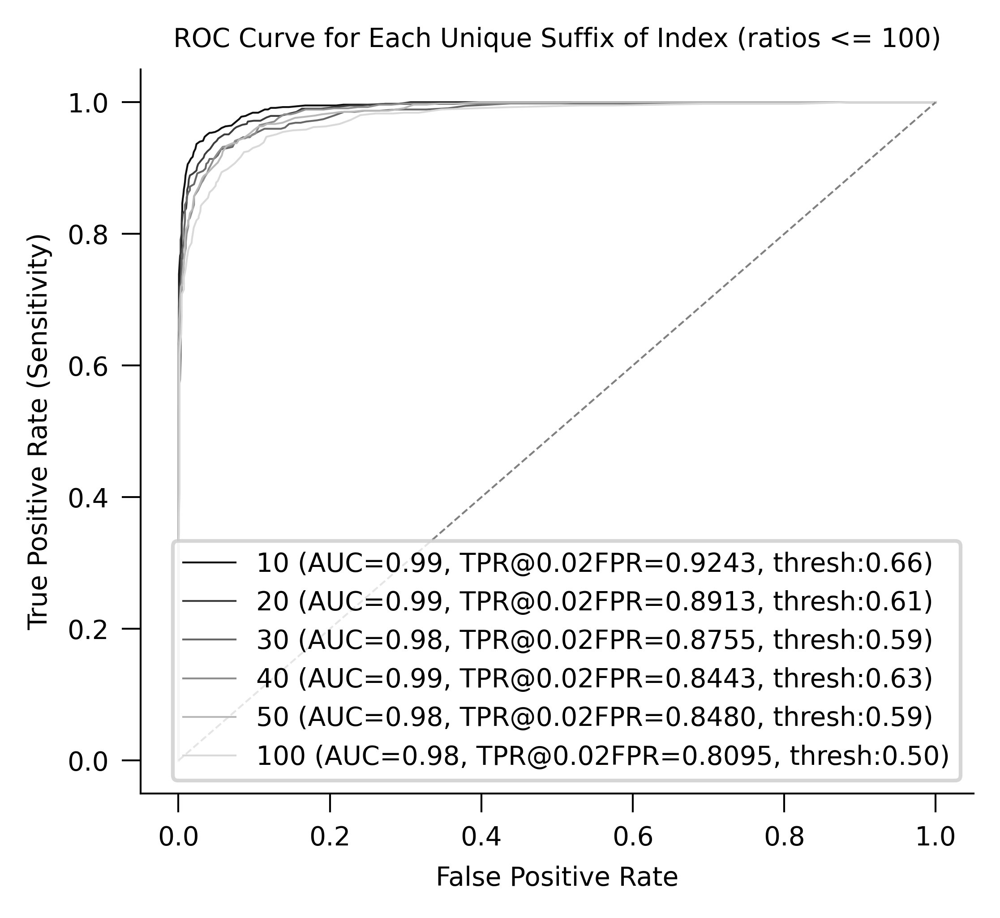


Paper threshold table (operating point @ FPR=0.02):
 downsampling_ratio      AUC  TPR_at_FPR0.02  threshold_at_FPR0.02  n_samples
                 10 0.992951        0.924298                  0.66       2205
                 20 0.989910        0.891331                  0.61       2205
                 30 0.983834        0.875458                  0.59       1470
                 40 0.985652        0.844322                  0.63       1470
                 50 0.984738        0.847985                  0.59       1470
                100 0.975229        0.809524                  0.50       2205


In [6]:
def per_suffix_roc(labeled_matrix, y_pred_proba_cv, target_fpr=0.02,
                   max_ratio=100, save_path=None):
    """Plot one ROC curve per down-sampling ratio (<= max_ratio) and return a summary DataFrame."""
    # Build suffix as a plain numpy array of ints (one per row of labeled_matrix)
    suffix = np.array([int(idx.split("_")[1]) for idx in labeled_matrix.index])
    y = labeled_matrix["HRDetect_binary"].values
    unique_suffixes = sorted([s for s in np.unique(suffix).tolist() if s <= max_ratio])
    # Light grey -> black, darker shades for higher power (= lower ratio).
    # unique_suffixes is ascending in ratio, so reverse the shade order so the
    # smallest ratio (highest power) gets the darkest shade.
    cmap = plt.get_cmap("Greys")
    n = len(unique_suffixes)
    shades = np.linspace(0.95, 0.25, n) if n > 1 else [0.7]
    colors = [cmap(v) for v in shades]

    rows = []
    plt.figure(figsize=(4, 3.5))
    for i, s in enumerate(unique_suffixes):
        mask = (suffix == s)
        fpr, tpr, thr = roc_curve(y[mask], y_pred_proba_cv[mask])
        roc_auc = auc(fpr, tpr)
        idx = int(np.argmin(np.abs(fpr - target_fpr)))
        tpr_at, thr_at = float(tpr[idx]), float(thr[idx])
        rows.append({"downsampling_ratio": s, "AUC": roc_auc,
                     "TPR_at_FPR0.02": tpr_at, "threshold_at_FPR0.02": thr_at,
                     "n_samples": int(mask.sum())})
        plt.plot(fpr, tpr, color=colors[i], linewidth=0.5,
                 label=f"{s} (AUC={roc_auc:.2f}, TPR@0.02FPR={tpr_at:.4f}, thresh:{thr_at:.2f})")

    plt.plot([0, 1], [0, 1], "--", color="grey", linewidth=0.5)
    plt.xlabel("False Positive Rate", fontsize=7)
    plt.ylabel("True Positive Rate (Sensitivity)", fontsize=7)
    plt.title(f"ROC Curve for Each Unique Suffix of Index (ratios <= {max_ratio})", fontsize=7)
    plt.legend(loc="lower right", fontsize=7)
    # Thin spines and tick marks to match.
    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.tick_params(width=0.5, labelsize=7)
    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()

    return pd.DataFrame(rows).sort_values("downsampling_ratio").reset_index(drop=True)


threshold_table = per_suffix_roc(
    labeled_matrix, y_pred_proba_cv,
    target_fpr=0.02,
    max_ratio=100,
    save_path=os.path.join(OUTDIR, "ROC_per_downsampling_ratio.pdf"),
)
print("\nPaper threshold table (operating point @ FPR=0.02):")
print(threshold_table.to_string(index=False))


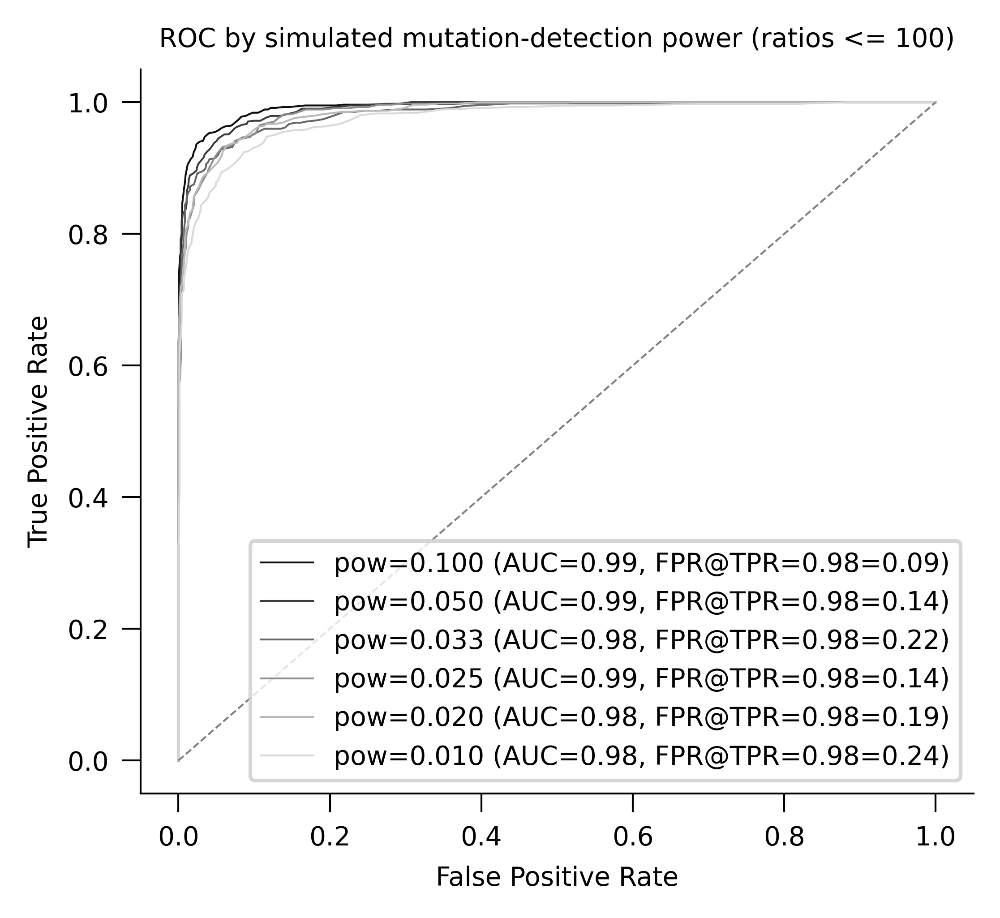


FPR table at TPR=0.98 (per simulated detection power):
 downsampling_ratio  simulated_power      AUC  achieved_TPR  FPR_at_TPR>=0.98  threshold  n_samples
                 10         0.100000 0.992951      0.981685          0.093074       0.47       2205
                 20         0.050000 0.989910      0.981685          0.142857       0.36       2205
                 30         0.033333 0.983834      0.985348          0.218615       0.27       1470
                 40         0.025000 0.985652      0.981685          0.139610       0.36       1470
                 50         0.020000 0.984738      0.981685          0.189394       0.30       1470
                100         0.010000 0.975229      0.980464          0.240260       0.18       2205


In [7]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import seaborn as sns
import pandas as pd
from sklearn.metrics import roc_curve, auc

plt.rcParams.update({"font.size": 16})
mpl.rcParams["pdf.fonttype"] = 42


def plot_roc_by_power(labeled_matrix, y_pred_proba_cv, target_tpr=0.98,
                      max_ratio=100, save_path=None):
    """Plot per-ratio ROC curves (ratios <= max_ratio) labelled by simulated detection power (1/ratio).

    Reports the FPR achieved at the strictest threshold whose TPR is >= target_tpr,
    so the reported FPR is a true upper-bound operating point rather than a nearest-
    neighbour staircase value.
    """
    suffix = np.array([int(idx.split("_")[1]) for idx in labeled_matrix.index])
    y = labeled_matrix["HRDetect_binary"].values
    unique_suffixes = sorted([s for s in np.unique(suffix).tolist() if s <= max_ratio])
    # Light grey -> black, darker shades for higher power (= lower ratio).
    # unique_suffixes is ascending in ratio, so reverse the shade order so the
    # smallest ratio (highest power) gets the darkest shade.
    cmap = plt.get_cmap("Greys")
    n = len(unique_suffixes)
    shades = np.linspace(0.95, 0.25, n) if n > 1 else [0.7]
    colors = [cmap(v) for v in shades]

    rows = []
    plt.figure(figsize=(4, 3.5))
    for i, s in enumerate(unique_suffixes):
        mask = (suffix == s)
        fpr, tpr, thr = roc_curve(y[mask], y_pred_proba_cv[mask])
        roc_auc = auc(fpr, tpr)

        # Strictest threshold whose TPR meets or exceeds target_tpr.
        eligible = np.where(tpr >= target_tpr)[0]
        if len(eligible) == 0:
            idx = int(np.argmax(tpr))
        else:
            idx = int(eligible[0])

        rows.append({
            "downsampling_ratio": s,
            "simulated_power":    1.0 / s,
            "AUC":                roc_auc,
            "achieved_TPR":       float(tpr[idx]),
            "FPR_at_TPR>=0.98":   float(fpr[idx]),
            "threshold":          float(thr[idx]),
            "n_samples":          int(mask.sum()),
        })

        plt.plot(fpr, tpr, color=colors[i], linewidth=0.5,
                 label=f"pow={1/s:.3f} (AUC={roc_auc:.2f}, "
                       f"FPR@TPR=0.98={fpr[idx]:.2f})")

    plt.plot([0, 1], [0, 1], "--", color="grey", linewidth=0.5)
    plt.xlabel("False Positive Rate", fontsize=7)
    plt.ylabel("True Positive Rate",  fontsize=7)
    plt.title(f"ROC by simulated mutation-detection power (ratios <= {max_ratio})", fontsize=7)
    plt.legend(loc="lower right", fontsize=7)
    plt.xticks(fontsize=7); plt.yticks(fontsize=7)
    # Thin spines and tick marks to match.
    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.tick_params(width=0.5)
    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()

    return pd.DataFrame(rows).sort_values("downsampling_ratio").reset_index(drop=True)


# ---- Call it ---------------------------------------------------------------
power_table = plot_roc_by_power(
    labeled_matrix, y_pred_proba_cv,
    target_tpr=0.98,
    max_ratio=100,
    save_path=os.path.join(OUTDIR, "ROC_per_power.pdf"),
)
print("\nFPR table at TPR=0.98 (per simulated detection power):")
print(power_table.to_string(index=False))


Operating threshold (FPR = 0.02) rises with burden: ~0.62–0.66 for mid-burden regimes (ratio 10–50), ~0.42–0.49 for very-low-burden regimes (ratio 100–150). A single global threshold under-classifies very-low-burden cells.

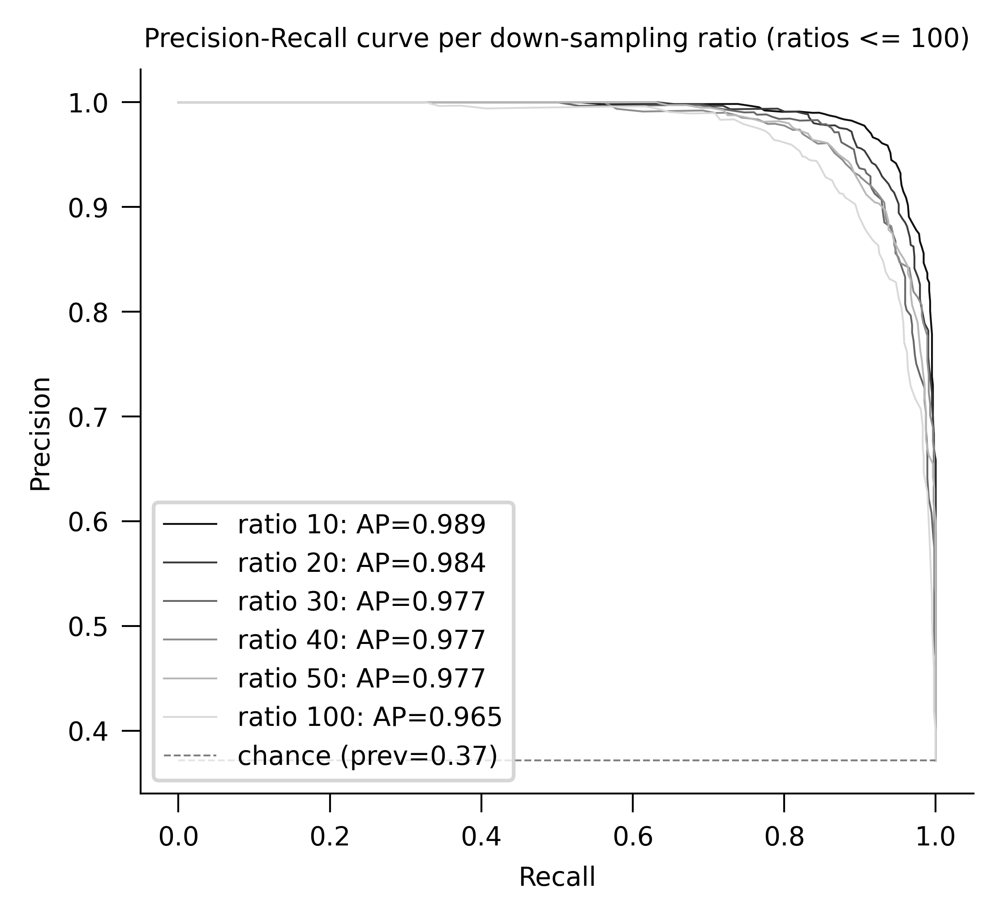


Class balance and imbalance-aware metrics per down-sampling ratio:
 downsampling_ratio  simulated_power  n_total  n_positive  positive_prevalence   PR_AUC  threshold  precision   recall       F1      MCC
                 10         0.100000     2205         819             0.371429 0.988696       0.68   0.966538 0.916972 0.941103 0.908507
                 20         0.050000     2205         819             0.371429 0.984415       0.61   0.965608 0.891331 0.926984 0.888239
                 30         0.033333     1470         546             0.371429 0.977101       0.60   0.971429 0.871795 0.918919 0.878054
                 40         0.025000     1470         546             0.371429 0.977141       0.64   0.969828 0.824176 0.891089 0.841077
                 50         0.020000     1470         546             0.371429 0.976764       0.59   0.962578 0.847985 0.901655 0.853211
                100         0.010000     2205         819             0.371429 0.964825       0.51   0.962963 

In [8]:
from sklearn.metrics import (precision_recall_curve, average_precision_score,
                             f1_score, matthews_corrcoef, confusion_matrix,
                             roc_curve)

def per_suffix_imbalance_metrics(labeled_matrix, y_pred_proba_cv,
                                 target_fpr=0.02, max_ratio=100, save_path=None):
    """Per-down-sampling-ratio PR curves + F1, MCC, precision, recall at
    the FPR<=target_fpr operating point. Reports class balance per subset.
    Only ratios <= max_ratio are plotted/tabulated."""
    suffix = np.array([int(idx.split("_")[1]) for idx in labeled_matrix.index])
    y = labeled_matrix["HRDetect_binary"].values
    unique_suffixes = sorted([s for s in np.unique(suffix).tolist() if s <= max_ratio])
    # Light grey -> black, with darker shades for higher power (lower ratio).
    # Sample from 0.25 (light grey) to 0.95 (near black) on the Greys colormap.
    cmap = plt.get_cmap("Greys")
    n = len(unique_suffixes)
    # Higher power = lower ratio = darker. unique_suffixes is ascending in ratio,
    # so reverse the shade order: smallest ratio gets the darkest shade.
    shades = np.linspace(0.95, 0.25, n) if n > 1 else [0.7]
    colors = [cmap(s) for s in shades]

    rows = []
    plt.figure(figsize=(4, 3.5))
    for i, s in enumerate(unique_suffixes):
        mask = (suffix == s)
        y_sub, p_sub = y[mask], y_pred_proba_cv[mask]

        # --- PR curve & PR-AUC (average precision) ---
        prec, rec, _ = precision_recall_curve(y_sub, p_sub)
        pr_auc = average_precision_score(y_sub, p_sub)
        plt.plot(rec, prec, color=colors[i], linewidth=0.5,
                 label=f"ratio {s}: AP={pr_auc:.3f}")

        # --- Operating point at strictest threshold with FPR <= target_fpr ---
        fpr, tpr, thr = roc_curve(y_sub, p_sub)
        eligible = np.where(fpr <= target_fpr)[0]
        idx = int(eligible[-1]) if len(eligible) else 0
        op_threshold = thr[idx]
        y_hat = (p_sub >= op_threshold).astype(int)

        tn, fp, fn, tp = confusion_matrix(y_sub, y_hat).ravel()
        precision_at = tp / (tp + fp) if (tp + fp) else float("nan")
        recall_at    = tp / (tp + fn) if (tp + fn) else float("nan")
        f1_at        = f1_score(y_sub, y_hat, zero_division=0)
        mcc_at       = matthews_corrcoef(y_sub, y_hat)
        prevalence   = y_sub.mean()

        rows.append({
            "downsampling_ratio":  s,
            "simulated_power":     1.0 / s,
            "n_total":             int(mask.sum()),
            "n_positive":          int(y_sub.sum()),
            "positive_prevalence": prevalence,
            "PR_AUC":              pr_auc,
            "threshold":           op_threshold,
            "precision":           precision_at,
            "recall":              recall_at,
            "F1":                  f1_at,
            "MCC":                 mcc_at,
        })

    # Baseline: prevalence across the reported subset
    reported_mask = np.isin(suffix, unique_suffixes)
    baseline_prevalence = y[reported_mask].mean()
    plt.hlines(baseline_prevalence, 0, 1, color="grey", ls="--", linewidth=0.5,
               label=f"chance (prev={baseline_prevalence:.2f})")
    plt.xlabel("Recall", fontsize=7); plt.ylabel("Precision", fontsize=7)
    plt.title(f"Precision-Recall curve per down-sampling ratio (ratios <= {max_ratio})", fontsize=7)
    plt.legend(loc="lower left", fontsize=7)
    # Thin the axis spines and tick marks to match.
    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_linewidth(0.5)
    ax.tick_params(width=0.5)
    if save_path:
        plt.savefig(save_path, format="pdf", bbox_inches="tight")
    plt.show()

    return pd.DataFrame(rows).sort_values("downsampling_ratio").reset_index(drop=True)


imbalance_table = per_suffix_imbalance_metrics(
    labeled_matrix, y_pred_proba_cv,
    target_fpr=0.02, max_ratio=100,
    save_path=os.path.join(OUTDIR, "PR_per_downsampling_ratio.pdf"),
)
print("\nClass balance and imbalance-aware metrics per down-sampling ratio:")
print(imbalance_table.to_string(index=False))


## 5. SHAP feature importance — Figure 1 in the paper

Which mutation channels drive the HRDetect-high prediction? `TreeExplainer` is fast enough to run on the full training matrix.


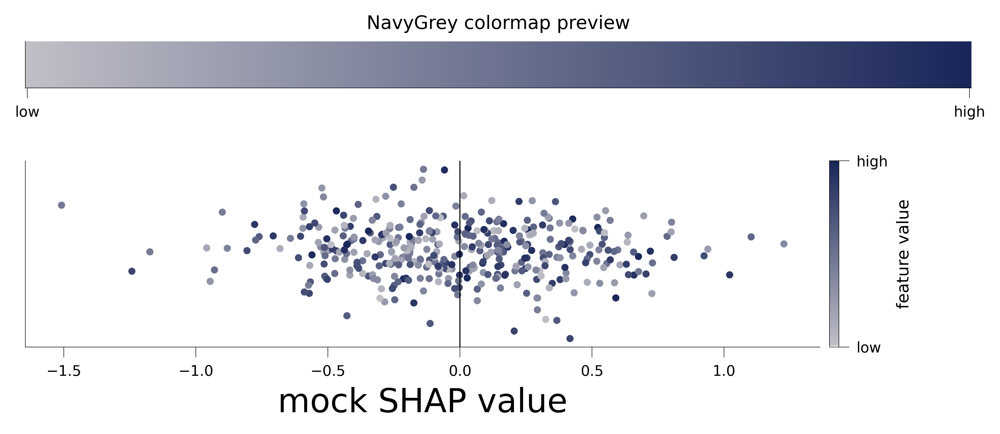

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Grey -> navy colormap. Low feature value = light grey, high feature value = navy.
NAVYGREY = LinearSegmentedColormap.from_list(
    "NavyGrey",
    [(0.75, 0.75, 0.78),   # light grey  (low)
     (0.10, 0.15, 0.35)],  # navy        (high)
    N=256,
)

# --- Preview ---------------------------------------------------------------
fig, axes = plt.subplots(2, 1, figsize=(7, 3.2),
                         gridspec_kw={"height_ratios": [1, 4]})

gradient = np.linspace(0, 1, 256).reshape(1, -1)
axes[0].imshow(gradient, aspect="auto", cmap=NAVYGREY)
axes[0].set_xticks([0, 255]); axes[0].set_xticklabels(["low", "high"])
axes[0].set_yticks([])
axes[0].set_title("NavyGrey colormap preview", fontsize=9)

rng = np.random.default_rng(0)
n = 400
shap_vals    = rng.normal(0, 0.4, n)
feature_vals = rng.uniform(0, 1, n)
sc = axes[1].scatter(shap_vals, rng.normal(0, 0.05, n),
                     c=feature_vals, cmap=NAVYGREY, s=12, edgecolor="none")
axes[1].axvline(0, color="k", lw=0.5)
axes[1].set_yticks([])
axes[1].set_xlabel("mock SHAP value")
cbar = fig.colorbar(sc, ax=axes[1], orientation="vertical", pad=0.01)
cbar.set_label("feature value", fontsize=8)
cbar.set_ticks([0, 1]); cbar.set_ticklabels(["low", "high"])

plt.tight_layout()
plt.show()

/tmp/ipykernel_2217996/1751012440.py:17: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_class1, X, show=False, max_display=20)


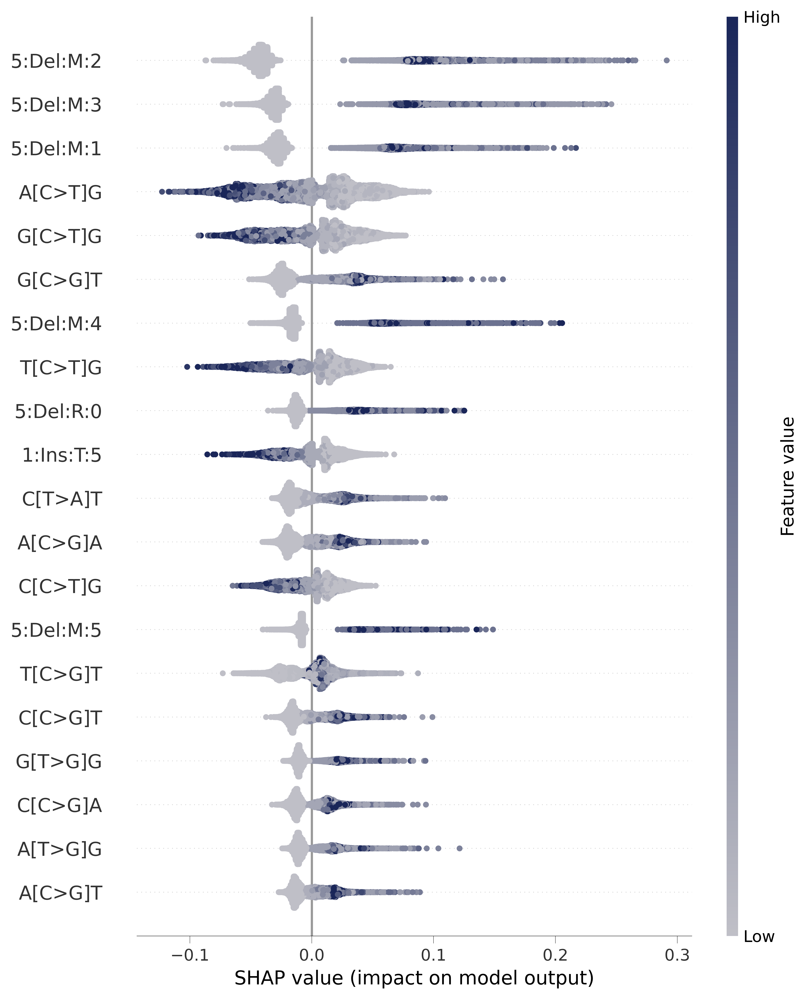

In [89]:
import shap
from matplotlib.colors import LinearSegmentedColormap

# Custom grey-green colormap to match the paper figure
NAVYGREY = LinearSegmentedColormap.from_list(
    "NavyGrey",
    [(0.75, 0.75, 0.78),   # light grey  (low)
     (0.10, 0.15, 0.35)],  # navy        (high)
    N=256,
)

explainer    = shap.TreeExplainer(rf_classifier)
shap_values  = explainer(X)
shap_class1  = shap_values[:, :, 1]  # contributions to the HRDetect-high class

plt.figure(figsize=(10, 8))
shap.summary_plot(shap_class1, X, show=False, max_display=20)
# Recolor the dot swarm with our grey-green palette
for fc in plt.gcf().get_children():
    for fcc in fc.get_children():
        if hasattr(fcc, "set_cmap"):
            fcc.set_cmap(NAVYGREY)
plt.savefig(os.path.join(OUTDIR, "shap_values_plot.pdf"),
            format="pdf", bbox_inches="tight", dpi=700)
plt.show()

## 6. Load scNanoSeq feature matrix and score each cell

Both feature matrices must already exist on disk (built upstream from the VCFs with
`musical.matrix_generator.annotate_snv` for SBS96 and SigProfilerMatrixGenerator
for ID83). Here we just load, align on common cells, **reindex columns to match the
training feature order**, and score.


In [10]:
def load_scnano_combined_matrix(snv_path=SNV_CATALOG_SCNANO,
                                 indel_path=INDEL_CATALOG_SCNANO):
    snv = pd.read_csv(snv_path, index_col=0).T
    ind = pd.read_csv(indel_path, index_col=0)  # already cells x features

    common = snv.index.intersection(ind.index)
    snv, ind = snv.loc[common], ind.loc[common]
    return pd.concat([snv, ind], axis=1)

combined_matrix_scNanoSeq = load_scnano_combined_matrix()
print(f"scNanoSeq matrix: {combined_matrix_scNanoSeq.shape[0]} cells x {combined_matrix_scNanoSeq.shape[1]} features")

# Reindex to the training feature order (fill missing channels with 0)
combined_matrix_scNanoSeq = combined_matrix_scNanoSeq.reindex(columns=FEATURE_COLS, fill_value=0)

# Published HRDscout predictions (scored with the loaded model)
scNanoSeq_prob_df = pd.read_csv("data/Fig6_scNanoSeq_HRD_classification/HRD_predictions.csv")
scNanoSeq_prob_df.head()

scNanoSeq matrix: 804 cells x 179 features


,cell,prob_HRDetect_high
0,BT12_sc001,0.15
1,BT12_sc002,0.25
2,BT12_sc003,0.45
3,BT12_sc004,0.07
4,BT12_sc005,0.22


## 7. Diagnostic panel (training/test burden + prediction distribution)

Useful supplementary figure to demonstrate that the scNanoSeq mutation burden distribution
falls within the down-sampled PCAWG training distribution.


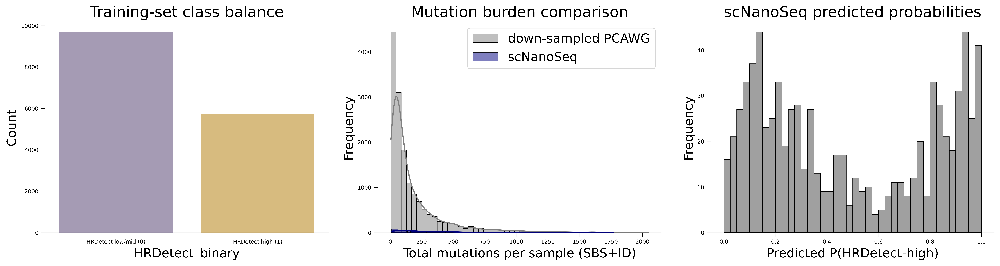

In [11]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Training class balance
counts = labeled_matrix["HRDetect_binary"].value_counts().sort_index()
sns.barplot(x=counts.index, y=counts.values,
            hue=counts.index, palette=["#a497b8", "#e6c070"],
            legend=False, ax=axes[0])
axes[0].set_xticks(range(len(counts)))
axes[0].set_xticklabels(["HRDetect low/mid (0)", "HRDetect high (1)"])
axes[0].set_ylabel("Count"); axes[0].set_title("Training-set class balance")

# Burden comparison
sns.histplot(labeled_matrix.drop(columns="HRDetect_binary").sum(axis=1),
             bins=50, kde=True, color="grey", ax=axes[1], label="down-sampled PCAWG")
sns.histplot(combined_matrix_scNanoSeq.sum(axis=1),
             bins=70, kde=True, color="navy", alpha=0.5, ax=axes[1], label="scNanoSeq")
axes[1].set_xlabel("Total mutations per sample (SBS+ID)"); axes[1].set_ylabel("Frequency")
axes[1].set_title("Mutation burden comparison"); axes[1].legend()

# scNanoSeq predicted probabilities
sns.histplot(scNanoSeq_prob_df["prob_HRDetect_high"], bins=40,
             color="grey", ax=axes[2])
axes[2].set_xlabel("Predicted P(HRDetect-high)"); axes[2].set_ylabel("Frequency")
axes[2].set_title("scNanoSeq predicted probabilities")

plt.tight_layout()
plt.savefig(os.path.join(OUTDIR, "diagnostic_panel.pdf"), format="pdf", bbox_inches="tight")
plt.show()

## 8. Cell-level HRDetect dot-grid — Figure 3 in the paper

One row per sample, one square per cell, dot size encodes `P(HRDetect-high)`.
Background colour distinguishes annotated tumour cells (`#f5c3bc`) from non-tumour cells (lightgrey).


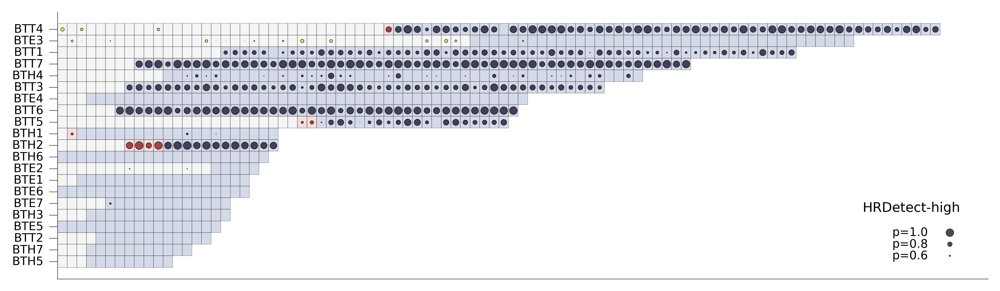

In [12]:
plt.rcParams.update({"font.size": 16})
mpl.rcParams["pdf.fonttype"] = 42

# ----- Sample-id mapping (internal -> ms_x display name) ----------------------
metadata_v2 = pd.read_csv(METADATA_V2)
sample_id_map = dict(zip(metadata_v2["Sample_ID_internal"], metadata_v2["Sample_ID_ms_x"]))

def _tumor_cells(row):
    if pd.isna(row["tumor_cells"]):
        return []
    return [c.replace(row["Sample_ID_internal"], row["Sample_ID_ms_x"], 1)
            for c in row["tumor_cells"].split(",")]

tumor_cells_list = metadata_v2.apply(_tumor_cells, axis=1).explode().tolist()

# ----- Tumor-adjacent cells (manually specified) ------------------------------

tumor_adjacent_cells_list = ['BTH1_sc321', 'BTH2_sc006', 'BTH2_sc007', 'BTH2_sc011', 'BTH2_sc012', 'BTT4_sc033', 'BTT5_sc023', 'BTT5_sc204']

# ----- Prepare prediction dataframe -------------------------------------------
predictions = scNanoSeq_prob_df.copy()
predictions["sample"] = predictions["cell"].str.split("_").str[0]
predictions["cell_display"] = predictions["cell"].apply(
    lambda x: sample_id_map.get(x.split("_")[0], x.split("_")[0]) + "_" + x.split("_", 1)[1]
)

# Sort samples by number of cells (descending)
sample_counts   = predictions["sample"].value_counts()
sorted_samples  = sample_counts.index.tolist()
max_cells       = int(sample_counts.max())

# ----- Style constants --------------------------------------------------------
TUMOR_BOX_COLOR     = "#8f9cc2"; TUMOR_BOX_ALPHA     = 0.37
ADJACENT_BOX_COLOR  = "#e8b4b4"; ADJACENT_BOX_ALPHA  = 0.45   # pastel red/pink                       # deeper dusty red
NORMAL_BOX_COLOR    = "#e6e7e8"; NORMAL_BOX_ALPHA    = 0.40
TUMOR_DOT_COLOR     = "#42415b"
ADJACENT_DOT_COLOR  = "#a04545"        
NORMAL_DOT_COLOR    = "#f7dd73"
BOX_EDGE_LW         = 0.25
DOT_EDGE_LW         = 0.25

# ----- Helper: classify a cell ------------------------------------------------
def _classify(cell_display):
    if cell_display in tumor_cells_list:
        return "tumor"
    if cell_display in tumor_adjacent_cells_list:
        return "adjacent"
    return "normal"

# ----- Plot --------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 2.9))

# Order so non-tumor first (left), then adjacent, then tumor (right)
_order = {"normal": 0, "adjacent": 1, "tumor": 2}

for row_idx, sample in enumerate(sorted_samples):
    sample_data = predictions[predictions["sample"] == sample].copy()
    sample_data["category"] = sample_data["cell_display"].apply(_classify)
    sample_data["_sort"]    = sample_data["category"].map(_order)
    sample_data = sample_data.sort_values("_sort")

    for col_idx, (cell, prob, category) in enumerate(zip(
            sample_data["cell_display"],
            sample_data["prob_HRDetect_high"],
            sample_data["category"])):

        if category == "tumor":
            bg_color, bg_alpha = TUMOR_BOX_COLOR, TUMOR_BOX_ALPHA
            dot_color = TUMOR_DOT_COLOR
        elif category == "adjacent":
            bg_color, bg_alpha = ADJACENT_BOX_COLOR, ADJACENT_BOX_ALPHA
            dot_color = ADJACENT_DOT_COLOR
        else:
            bg_color, bg_alpha = NORMAL_BOX_COLOR, NORMAL_BOX_ALPHA
            dot_color = NORMAL_DOT_COLOR

        ax.add_patch(plt.Rectangle(
            (col_idx, row_idx), 1, 1,
            facecolor=bg_color, alpha=bg_alpha,
            edgecolor="black", linewidth=BOX_EDGE_LW,
        ))

        if prob > 0.50:
            scaled = ((prob - 0.5) / 0.3) ** 2   # nonlinear 0.5..0.8 -> 0..1
            ax.scatter(col_idx + 0.5, row_idx + 0.5,
                       s=scaled * 8, color=dot_color, alpha=1.0,
                       edgecolor="black", linewidth=DOT_EDGE_LW)

# Y-tick labels = display sample IDs
ytick_labels = [sample_id_map.get(s, s) for s in sorted_samples]
ax.set_xlim(0, max_cells + 5); ax.set_ylim(-1, len(sorted_samples) + 1)
ax.set_yticks([i + 0.5 for i in range(len(sorted_samples))])
ax.set_yticklabels(ytick_labels, verticalalignment="center")
ax.set_xticks([]); ax.invert_yaxis()

# Legend (probability size key)
legend_x = max_cells + 1
legend_y = len(sorted_samples) - 1
ax.text(legend_x - 4, legend_y - 3.8, "HRDetect-high", fontsize=8, ha="center")
for i, prob in enumerate([0.6, 0.8, 1.0]):
    ax.scatter(legend_x, legend_y - i,
               s=(((prob - 0.5) / 0.3) ** 2) * 8,
               color="k", alpha=0.7,
               edgecolor="black", linewidth=DOT_EDGE_LW)
    ax.text(legend_x - 6, legend_y - i, f"p={prob:.1f}", verticalalignment="center", fontsize=7)

plt.savefig(os.path.join(OUTDIR, "HRD_Classification_scNanoSeq_dotgrid.pdf"),
            format="pdf", bbox_inches="tight")
plt.show()

{'BTH2_sc009', 'BTH2_sc007', 'BTH2_sc002', 'BTH2_sc208', 'BTH2_sc010', 'BTH2_sc001', 'BTH2_sc209', 'BTH2_sc203', 'BTH2_sc011', 'BTH2_sc006', 'BTH2_sc003', 'BTH2_sc012', 'BTH2_sc005', 'BTH2_sc201', 'BTH2_sc008', 'BTH2_sc205'}
[BTH2] tumor: 12 (12 HRD, 0 non-HRD)  |  adjacent: 4 (4 HRD, 0 non-HRD)  |  normal: 7 (0 HRD, 7 non-HRD)  |  total: 23


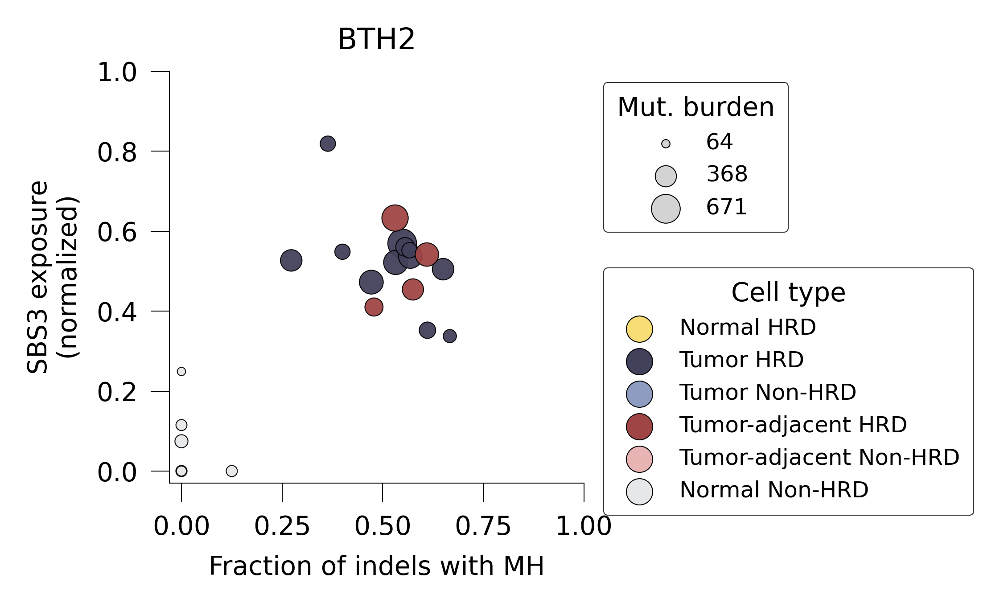

{'BTT1_sc027', 'BTT1_sc110', 'BTT1_sc147', 'BTT1_sc140', 'BTT1_sc148', 'BTT1_sc146', 'BTT1_sc116', 'BTT1_sc120', 'BTT1_sc130', 'BTT1_sc133', 'BTT1_sc138', 'BTT1_sc141', 'BTT1_sc010', 'BTT1_sc137', 'BTT1_sc020', 'BTT1_sc118', 'BTT1_sc023', 'BTT1_sc121', 'BTT1_sc129', 'BTT1_sc131', 'BTT1_sc017', 'BTT1_sc103', 'BTT1_sc029', 'BTT1_sc127', 'BTT1_sc125', 'BTT1_sc012', 'BTT1_sc136', 'BTT1_sc102', 'BTT1_sc113', 'BTT1_sc119', 'BTT1_sc123', 'BTT1_sc108', 'BTT1_sc016', 'BTT1_sc122', 'BTT1_sc106', 'BTT1_sc112', 'BTT1_sc134', 'BTT1_sc101', 'BTT1_sc117', 'BTT1_sc142', 'BTT1_sc025', 'BTT1_sc114', 'BTT1_sc105', 'BTT1_sc111', 'BTT1_sc124', 'BTT1_sc004', 'BTT1_sc014', 'BTT1_sc032', 'BTT1_sc107', 'BTT1_sc143', 'BTT1_sc126', 'BTT1_sc009', 'BTT1_sc109', 'BTT1_sc139', 'BTT1_sc128', 'BTT1_sc104', 'BTT1_sc015', 'BTT1_sc135', 'BTT1_sc145'}
[BTT1] tumor: 60 (59 HRD, 1 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 17 (0 HRD, 17 non-HRD)  |  total: 77


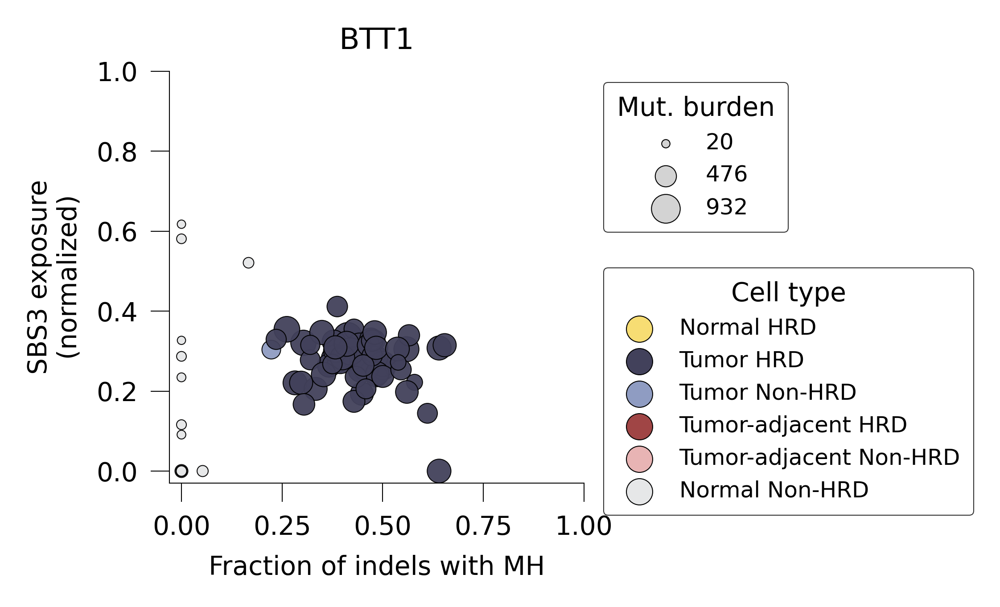

{'BTT3_sc352', 'BTT3_sc359', 'BTT3_sc365', 'BTT3_sc347', 'BTT3_sc379', 'BTT3_sc340', 'BTT3_sc353', 'BTT3_sc366', 'BTT3_sc356', 'BTT3_sc341', 'BTT3_sc361', 'BTT3_sc344', 'BTT3_sc380', 'BTT3_sc343', 'BTT3_sc385', 'BTT3_sc378', 'BTT3_sc351', 'BTT3_sc367', 'BTT3_sc339', 'BTT3_sc360', 'BTT3_sc355', 'BTT3_sc364', 'BTT3_sc358', 'BTT3_sc350', 'BTT3_sc389', 'BTT3_sc387', 'BTT3_sc338', 'BTT3_sc357', 'BTT3_sc342', 'BTT3_sc349', 'BTT3_sc369', 'BTT3_sc372', 'BTT3_sc375', 'BTT3_sc388', 'BTT3_sc363', 'BTT3_sc376', 'BTT3_sc348', 'BTT3_sc346', 'BTT3_sc381', 'BTT3_sc377', 'BTT3_sc384', 'BTT3_sc383', 'BTT3_sc386', 'BTT3_sc373', 'BTT3_sc382', 'BTT3_sc337', 'BTT3_sc354', 'BTT3_sc374', 'BTT3_sc371', 'BTT3_sc390'}
[BTT3] tumor: 50 (50 HRD, 0 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 7 (0 HRD, 7 non-HRD)  |  total: 57


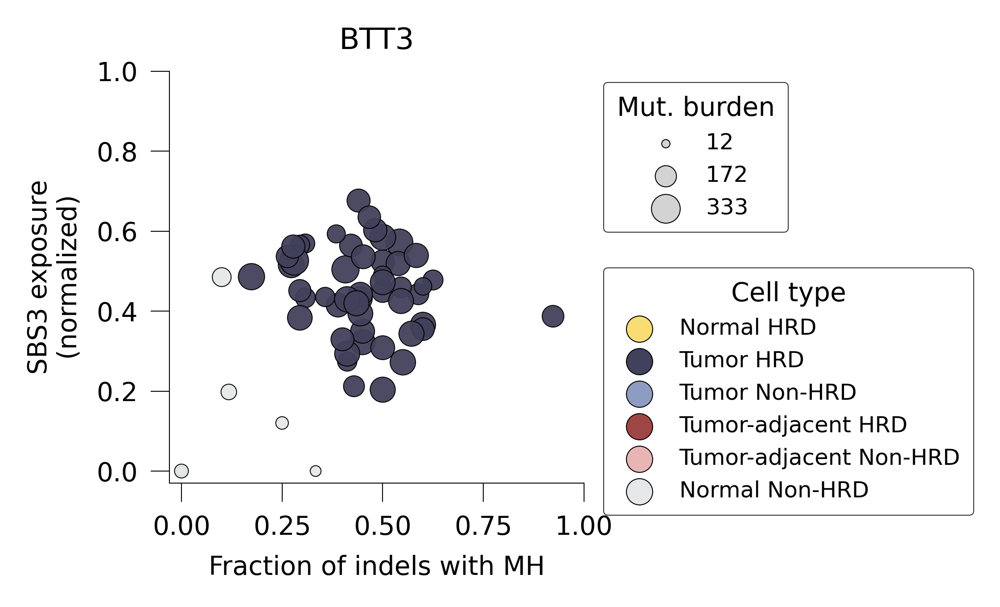

{'BTT4_sc329', 'BTT4_sc309', 'BTT4_sc029', 'BTT4_sc033', 'BTT4_sc047', 'BTT4_sc214', 'BTT4_sc317', 'BTT4_sc102', 'BTT4_sc314', 'BTT4_sc315', 'BTT4_sc031', 'BTT4_sc004', 'BTT4_sc308', 'BTT4_sc343', 'BTT4_sc346', 'BTT4_sc337', 'BTT4_sc342', 'BTT4_sc313', 'BTT4_sc046', 'BTT4_sc104', 'BTT4_sc018', 'BTT4_sc128', 'BTT4_sc344', 'BTT4_sc108', 'BTT4_sc305', 'BTT4_sc316', 'BTT4_sc341', 'BTT4_sc126', 'BTT4_sc320', 'BTT4_sc125', 'BTT4_sc310', 'BTT4_sc331', 'BTT4_sc303', 'BTT4_sc321', 'BTT4_sc322', 'BTT4_sc334', 'BTT4_sc226', 'BTT4_sc028', 'BTT4_sc336', 'BTT4_sc311', 'BTT4_sc327', 'BTT4_sc302', 'BTT4_sc325', 'BTT4_sc319', 'BTT4_sc340', 'BTT4_sc338', 'BTT4_sc345', 'BTT4_sc339', 'BTT4_sc332', 'BTT4_sc003', 'BTT4_sc323', 'BTT4_sc306', 'BTT4_sc326', 'BTT4_sc301', 'BTT4_sc328', 'BTT4_sc333', 'BTT4_sc016', 'BTT4_sc017', 'BTT4_sc001', 'BTT4_sc312'}
[BTT4] tumor: 57 (56 HRD, 1 non-HRD)  |  adjacent: 1 (1 HRD, 0 non-HRD)  |  normal: 34 (3 HRD, 31 non-HRD)  |  total: 92


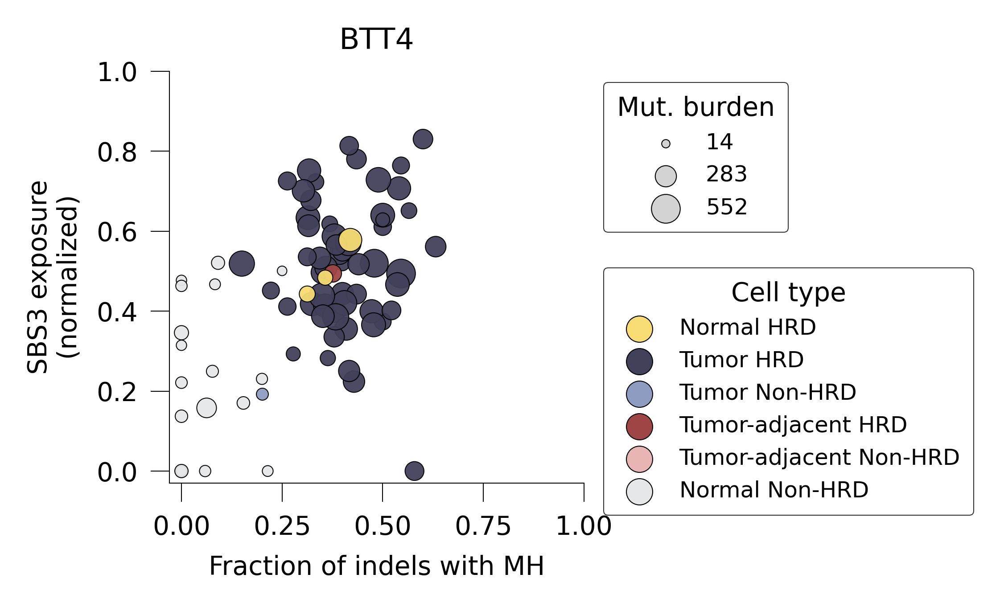

{'BTT5_sc203', 'BTT5_sc021', 'BTT5_sc201', 'BTT5_sc205', 'BTT5_sc025', 'BTT5_sc041', 'BTT5_sc031', 'BTT5_sc035', 'BTT5_sc024', 'BTT5_sc008', 'BTT5_sc032', 'BTT5_sc034', 'BTT5_sc206', 'BTT5_sc054', 'BTT5_sc202', 'BTT5_sc033', 'BTT5_sc023', 'BTT5_sc204', 'BTT5_sc028', 'BTT5_sc040', 'BTT5_sc051'}
[BTT5] tumor: 20 (19 HRD, 1 non-HRD)  |  adjacent: 2 (2 HRD, 0 non-HRD)  |  normal: 25 (0 HRD, 25 non-HRD)  |  total: 47


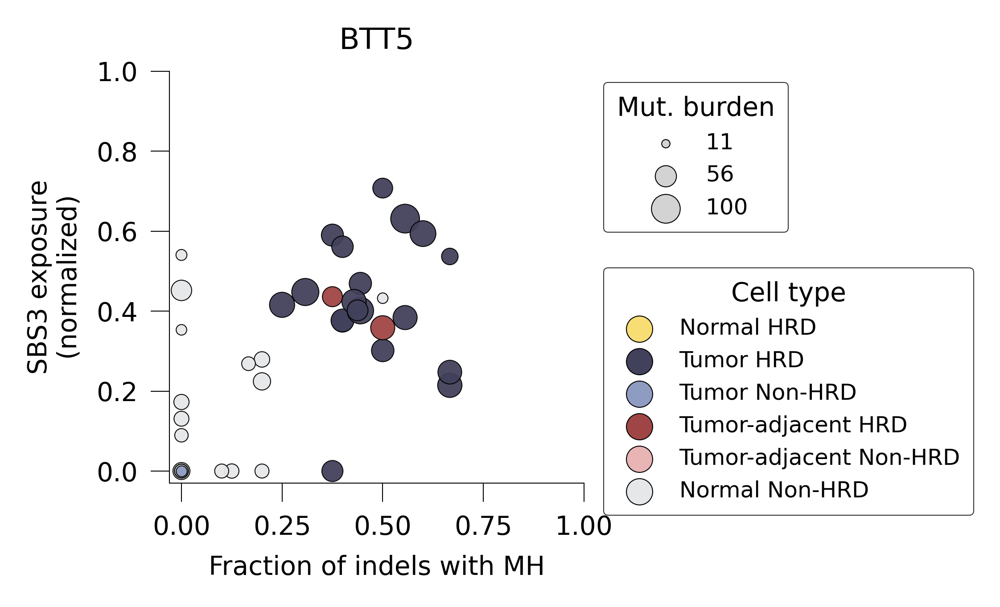

{'BTT6_sc032', 'BTT6_sc020', 'BTT6_sc039', 'BTT6_sc018', 'BTT6_sc028', 'BTT6_sc014', 'BTT6_sc037', 'BTT6_sc022', 'BTT6_sc040', 'BTT6_sc024', 'BTT6_sc009', 'BTT6_sc035', 'BTT6_sc017', 'BTT6_sc006', 'BTT6_sc030', 'BTT6_sc013', 'BTT6_sc008', 'BTT6_sc029', 'BTT6_sc004', 'BTT6_sc021', 'BTT6_sc034', 'BTT6_sc015', 'BTT6_sc001', 'BTT6_sc005', 'BTT6_sc033', 'BTT6_sc010', 'BTT6_sc016', 'BTT6_sc026', 'BTT6_sc025', 'BTT6_sc206', 'BTT6_sc019', 'BTT6_sc027', 'BTT6_sc041', 'BTT6_sc012', 'BTT6_sc023', 'BTT6_sc031', 'BTT6_sc003', 'BTT6_sc002', 'BTT6_sc036', 'BTT6_sc011', 'BTT6_sc007', 'BTT6_sc038'}
[BTT6] tumor: 42 (42 HRD, 0 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 6 (0 HRD, 6 non-HRD)  |  total: 48


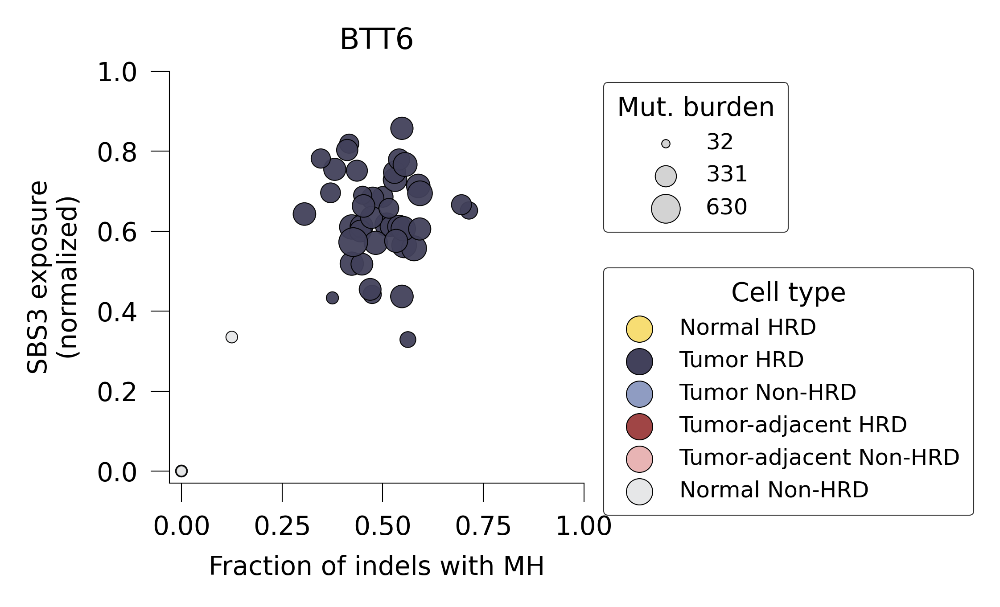

{'BTT7_sc001', 'BTT7_sc060', 'BTT7_sc066', 'BTT7_sc021', 'BTT7_sc027', 'BTT7_sc031', 'BTT7_sc014', 'BTT7_sc033', 'BTT7_sc029', 'BTT7_sc046', 'BTT7_sc047', 'BTT7_sc053', 'BTT7_sc036', 'BTT7_sc008', 'BTT7_sc022', 'BTT7_sc032', 'BTT7_sc048', 'BTT7_sc018', 'BTT7_sc039', 'BTT7_sc016', 'BTT7_sc054', 'BTT7_sc037', 'BTT7_sc057', 'BTT7_sc049', 'BTT7_sc041', 'BTT7_sc052', 'BTT7_sc005', 'BTT7_sc059', 'BTT7_sc010', 'BTT7_sc028', 'BTT7_sc063', 'BTT7_sc002', 'BTT7_sc064', 'BTT7_sc065', 'BTT7_sc051', 'BTT7_sc030', 'BTT7_sc050', 'BTT7_sc013', 'BTT7_sc038', 'BTT7_sc009', 'BTT7_sc061', 'BTT7_sc035', 'BTT7_sc062', 'BTT7_sc056', 'BTT7_sc015', 'BTT7_sc007', 'BTT7_sc004', 'BTT7_sc003', 'BTT7_sc024', 'BTT7_sc058', 'BTT7_sc023', 'BTT7_sc012', 'BTT7_sc034', 'BTT7_sc019', 'BTT7_sc017', 'BTT7_sc006', 'BTT7_sc026', 'BTT7_sc040'}
[BTT7] tumor: 58 (58 HRD, 0 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 8 (0 HRD, 8 non-HRD)  |  total: 66


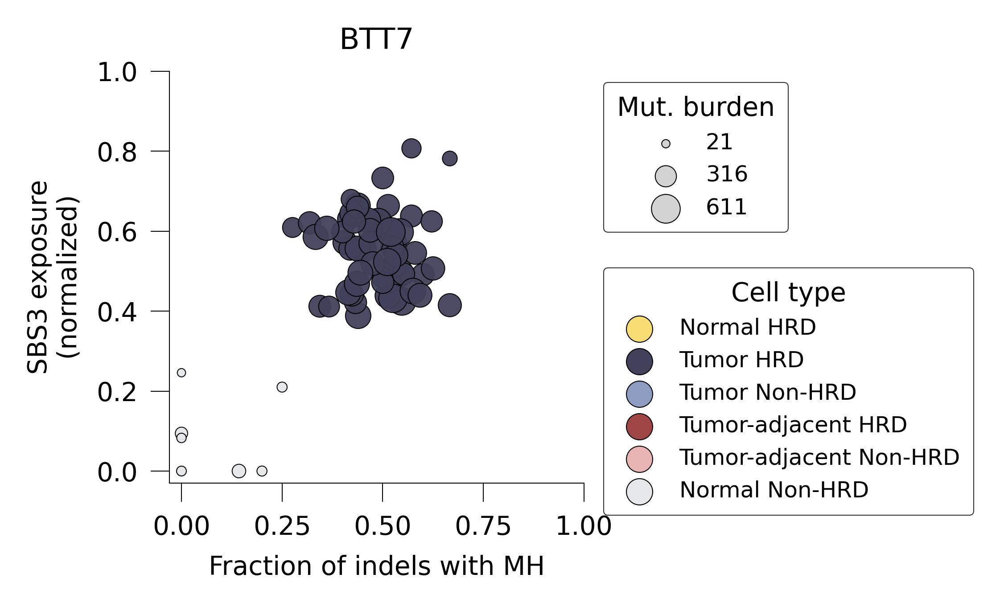

{'BTE3_sc076', 'BTE3_sc057', 'BTE3_sc028', 'BTE3_sc055', 'BTE3_sc067', 'BTE3_sc058', 'BTE3_sc023', 'BTE3_sc074', 'BTE3_sc078', 'BTE3_sc052', 'BTE3_sc026', 'BTE3_sc054', 'BTE3_sc040', 'BTE3_sc012', 'BTE3_sc073'}
[BTE3] tumor: 0 (0 HRD, 0 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 83 (15 HRD, 68 non-HRD)  |  total: 83


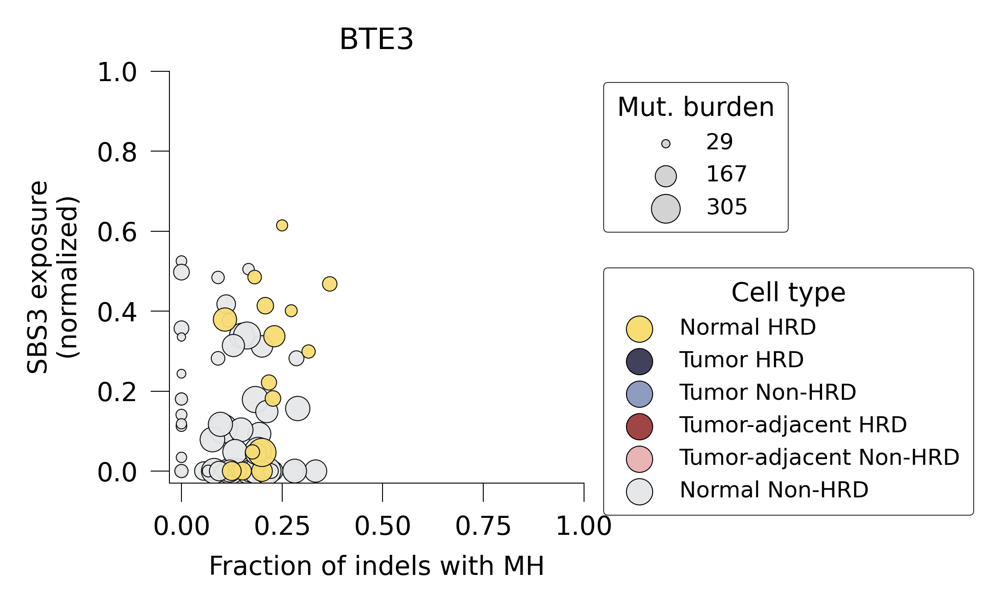

{'BTH4_sc011', 'BTH4_sc051', 'BTH4_sc003', 'BTH4_sc010', 'BTH4_sc027', 'BTH4_sc016', 'BTH4_sc041', 'BTH4_sc013', 'BTH4_sc065', 'BTH4_sc061', 'BTH4_sc062', 'BTH4_sc024', 'BTH4_sc048', 'BTH4_sc031', 'BTH4_sc006', 'BTH4_sc014', 'BTH4_sc007', 'BTH4_sc049', 'BTH4_sc022', 'BTH4_sc032', 'BTH4_sc039', 'BTH4_sc015', 'BTH4_sc009', 'BTH4_sc056', 'BTH4_sc035', 'BTH4_sc043'}
[BTH4] tumor: 50 (26 HRD, 24 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 11 (0 HRD, 11 non-HRD)  |  total: 61


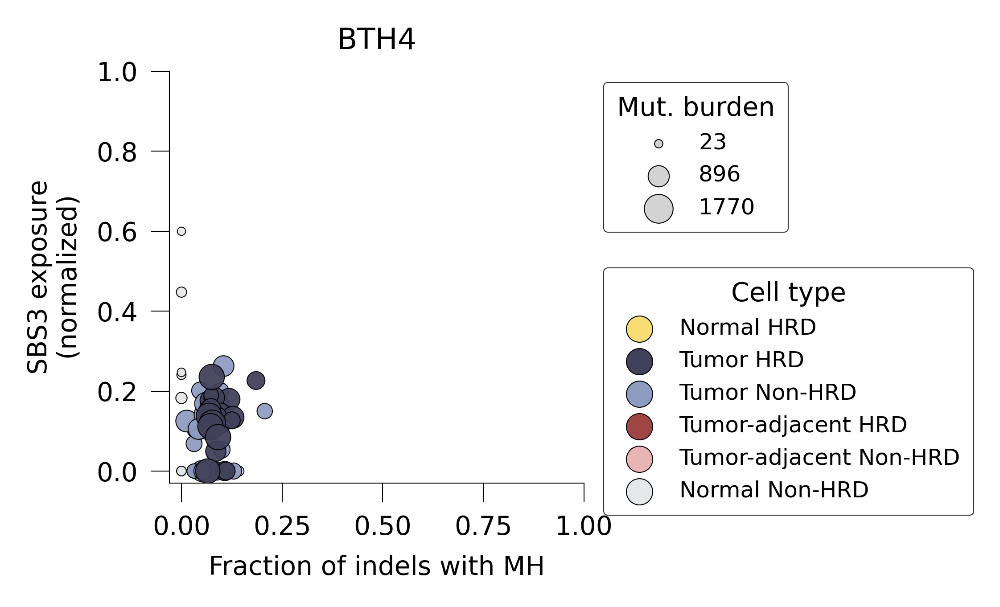

set()
[BTT2] tumor: 12 (0 HRD, 12 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 4 (0 HRD, 4 non-HRD)  |  total: 16


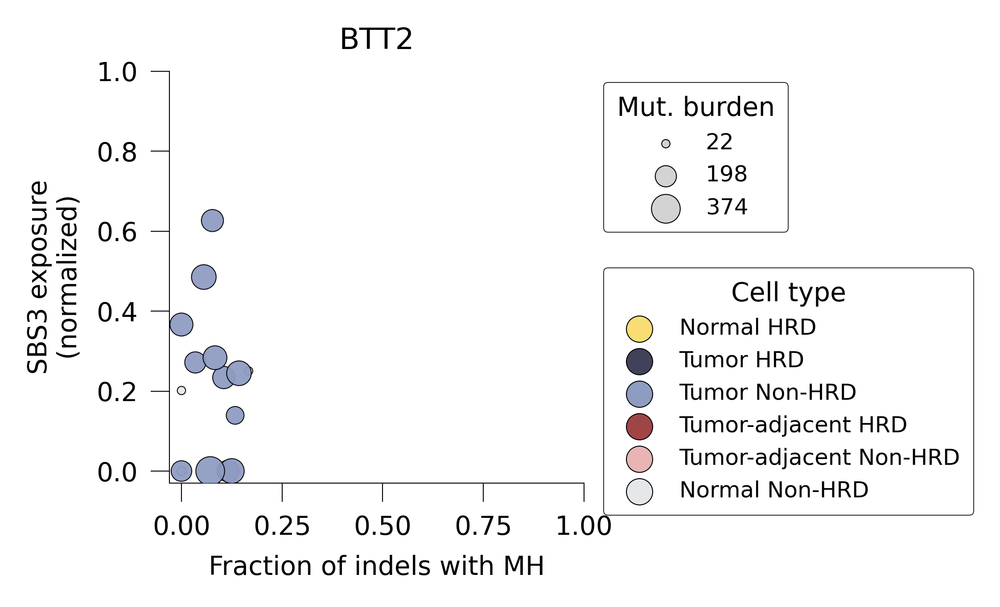

set()
[BTE4] tumor: 46 (0 HRD, 46 non-HRD)  |  adjacent: 0 (0 HRD, 0 non-HRD)  |  normal: 3 (0 HRD, 3 non-HRD)  |  total: 49


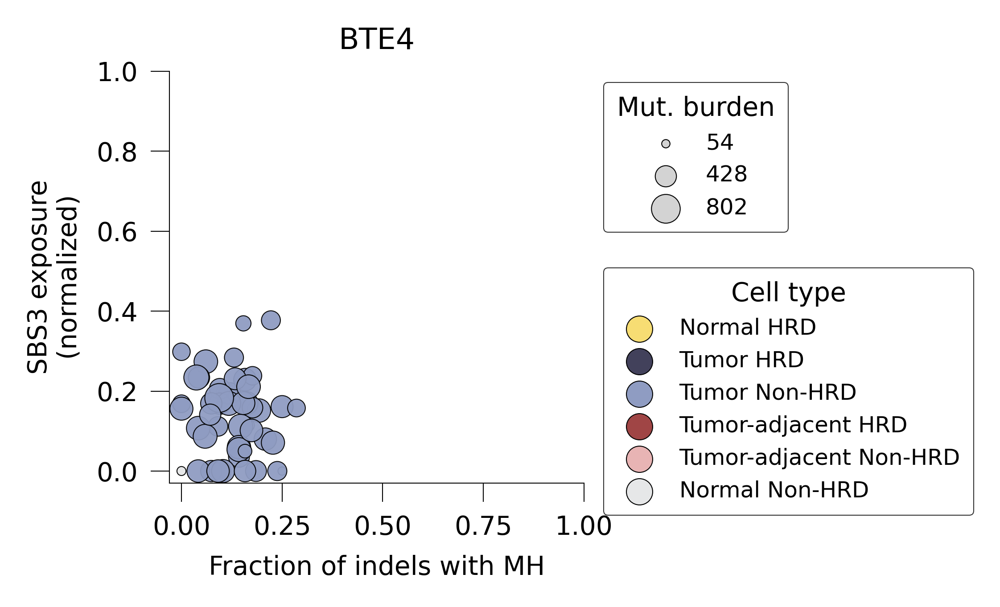

In [13]:
# ---- Paths -------------------------------------------------------------------
ID_COUNT_MATRIX_PATH   = INDEL_CATALOG_SCNANO
SNV_COUNT_MATRIX_PATH  = "data/Fig6_scNanoSeq_HRD_classification/X_PerCell.csv"
SNV_EXPOSURES_PATH     = "data/Fig6_scNanoSeq_HRD_classification/Mar5_perCellSigFitting_0.001thresh_v4Catalog.csv"
HRD_PREDICTIONS_PATH   = "data/Fig6_scNanoSeq_HRD_classification/HRD_predictions.csv"
PLOT_OUTDIR            = os.path.join(OUTDIR, "SBS3_ID_plots")
os.makedirs(PLOT_OUTDIR, exist_ok=True)

# ---- Tumor-adjacent cells ----------------------------------------------------
tumor_adjacent_cells_list = [
    'BTH1_sc321', 'BTH2_sc006', 'BTH2_sc007', 'BTH2_sc011', 'BTH2_sc012',
    'BTT4_sc033', 'BTT5_sc023', 'BTT5_sc204',
]

# ---- Style constants (matched to the dot-grid figure) ------------------------
TUMOR_HRD_COLOR        = "#42415b"   # dark navy
TUMOR_NONHRD_COLOR     = "#8f9cc2"   # muted blue
ADJACENT_HRD_COLOR     = "#a04545"   # deeper dusty red
ADJACENT_NONHRD_COLOR  = "#e8b4b4"   # pastel red/pink
NORMAL_HRD_COLOR       = "#f7dd73"   # warm yellow
NORMAL_NONHRD_COLOR    = "#e6e7e8"   # light grey
DOT_EDGE_LW            = 0.25

COLOR_MAP = {
    "Normal HRD":            NORMAL_HRD_COLOR,
    "Tumor HRD":             TUMOR_HRD_COLOR,
    "Tumor Non-HRD":         TUMOR_NONHRD_COLOR,
    "Tumor-adjacent HRD":    ADJACENT_HRD_COLOR,
    "Tumor-adjacent Non-HRD":ADJACENT_NONHRD_COLOR,
    "Normal Non-HRD":        NORMAL_NONHRD_COLOR,
}

SAMPLES_TO_PLOT = ["BTH2", "BTT1", "BTT3", "BTT4", "BTT5", "BTT6", "BTT7", "BTE3", "BTH4", "BTT2", "BTE4"]
HRD_DELETION_ROWS = ["5:Del:M:1", "5:Del:M:2", "5:Del:M:3",
                     "5:Del:M:4", "5:Del:M:5", "5:Del:R:0"]
SIZE_MIN, SIZE_MAX = 5, 60
HRD_THRESHOLD = 0.50


# ---- Load the per-cell feature tables ----------------------------------------
# IMPORTANT: the ID matrix is rows=cells, cols=ID83 channels (already transposed)
ID_count_matrix = pd.read_csv(ID_COUNT_MATRIX_PATH, index_col=0)

# Map internal sample IDs in row names to display IDs (e.g. BT12_sc001 -> BTH2_sc001)
def _map_cell_name(cell):
    parts = cell.split("_", 1)                       # "BT12_sc001" -> ("BT12", "sc001")
    return sample_id_map.get(parts[0], parts[0]) + "_" + parts[1]


# ---- Helper: zero-pad BTE3 cell suffixes to 3 digits ------------------------
# BTE3 cells are unpadded in HRD_predictions AND in ID_count_matrix
# (e.g. "BTE3_sc12"), but padded to 3 digits in SNV_count_matrix and
# SNV_exposures (e.g. "BTE3_sc012"). Pad BTE3 cell names to 3 digits so
# they match the SNV matrices.
def _pad_bte3_cell(cell):
    if not cell.startswith("BTE3_sc"):
        return cell
    suffix = cell[len("BTE3_sc"):]
    if suffix.isdigit():
        return f"BTE3_sc{int(suffix):03d}"
    return cell


plt.rcParams.update({"font.size": 16})
mpl.rcParams["pdf.fonttype"] = 42

# ----- Sample-id mapping (internal -> ms_x display name) ----------------------
metadata_v2 = pd.read_csv(METADATA_V2)
sample_id_map = dict(zip(metadata_v2["Sample_ID_internal"], metadata_v2["Sample_ID_ms_x"]))

def _tumor_cells(row):
    if pd.isna(row["tumor_cells"]):
        return []
    return [c.replace(row["Sample_ID_internal"], row["Sample_ID_ms_x"], 1)
            for c in row["tumor_cells"].split(",")]

tumor_cells_list = metadata_v2.apply(_tumor_cells, axis=1).explode().tolist()

# ----- Tumor-adjacent cells (manually specified) ------------------------------

tumor_adjacent_cells_list = ['BTH1_sc321', 'BTH2_sc006', 'BTH2_sc007', 'BTH2_sc011', 'BTH2_sc012', 'BTT4_sc033', 'BTT5_sc023', 'BTT5_sc204']

# Rename ID matrix cells from internal -> display IDs, then pad BTE3 cells
# to 3 digits so they match the SNV matrices.
ID_count_matrix.index = [_map_cell_name(c) for c in ID_count_matrix.index]
ID_count_matrix.index = [_pad_bte3_cell(c) for c in ID_count_matrix.index]

SNV_count_matrix = pd.read_csv(SNV_COUNT_MATRIX_PATH, index_col=0)  # rows=channels, cols=cells
SNV_exposures    = pd.read_csv(SNV_EXPOSURES_PATH,    index_col=0)  # rows=sigs,     cols=cells
HRD_predictions = pd.read_csv(HRD_PREDICTIONS_PATH)
HRD_predictions["cell"]   = HRD_predictions["cell"].apply(_map_cell_name)
HRD_predictions["sample"] = HRD_predictions["cell"].str.split("_").str[0]

if "sample" not in HRD_predictions.columns:
    HRD_predictions["sample"] = HRD_predictions["cell"].str.split("_").str[0]


# ---- Helper: classify a cell into one of the six colour categories ----------
def classify_cell(cell_name, hrd_cell_set, tumor_set, adjacent_set):
    is_hrd = cell_name in hrd_cell_set
    if cell_name in tumor_set:
        return "Tumor HRD" if is_hrd else "Tumor Non-HRD"
    if cell_name in adjacent_set:
        return "Tumor-adjacent HRD" if is_hrd else "Tumor-adjacent Non-HRD"
    return "Normal HRD" if is_hrd else "Normal Non-HRD"


tumor_set    = set(tumor_cells_list)
adjacent_set = set(tumor_adjacent_cells_list)

# ---- Per-sample plot ---------------------------------------------------------
for sample in SAMPLES_TO_PLOT:
    display_sample = sample_id_map.get(sample, sample)

    sample_pred = HRD_predictions[HRD_predictions["sample"] == sample]
    hrd_cells   = set(sample_pred.loc[sample_pred["prob_HRDetect_high"] > HRD_THRESHOLD, "cell"])

    # BTE3 HRD predictions are unpadded — pad to match the (now-padded) ID
    # matrix and the SNV matrices.
    if sample == "BTE3":
        hrd_cells = {_pad_bte3_cell(c) for c in hrd_cells}

    print(hrd_cells)

    # Cells present across ID rows, SNV exposure cols, and SNV count cols
    id_cells_in_sample = [c for c in ID_count_matrix.index
                          if c.startswith(f"{display_sample}_")]
    cells = (pd.Index(id_cells_in_sample)
               .intersection(SNV_exposures.columns)
               .intersection(SNV_count_matrix.columns))
    if len(cells) == 0:
        print(f"[{sample}] no overlapping cells across matrices — skipped")
        continue

    # Subset matrices once per sample
    ID_sub  = ID_count_matrix.loc[cells]            # rows=cells, cols=ID83 channels
    SNV_sub = SNV_count_matrix[cells]                # rows=channels, cols=cells
    EXP_sub = SNV_exposures[cells]                   # rows=sigs,     cols=cells

    # x-axis: fraction of HRD deletions per cell
    id_totals = ID_sub.sum(axis=1)
    x_frac    = (ID_sub[HRD_DELETION_ROWS].sum(axis=1) / id_totals).fillna(0)

    # y-axis: normalised SBS3 exposure per cell
    exp_totals = EXP_sub.sum(axis=0)
    y_frac     = (EXP_sub.loc["SBS3"] / exp_totals).fillna(0)

    # Dot size: total mutation burden per cell (SBS + ID)
    burdens = SNV_sub.sum(axis=0) + id_totals
    bmin, bmax = burdens.min(), burdens.max()
    if bmax > bmin:
        sizes = SIZE_MIN + (SIZE_MAX - SIZE_MIN) * (burdens - bmin) / (bmax - bmin)
    else:
        sizes = pd.Series(SIZE_MIN, index=burdens.index)

    # Cell category per cell
    categories = pd.Series(
        {c: classify_cell(c, hrd_cells, tumor_set, adjacent_set) for c in cells},
        index=cells,
    )

    # ---- Per-sample cell counts ---------------------------------------------
    n_tumor_hrd        = int((categories == "Tumor HRD").sum())
    n_tumor_nonhrd     = int((categories == "Tumor Non-HRD").sum())
    n_adjacent_hrd     = int((categories == "Tumor-adjacent HRD").sum())
    n_adjacent_nonhrd  = int((categories == "Tumor-adjacent Non-HRD").sum())
    n_normal_hrd       = int((categories == "Normal HRD").sum())
    n_normal_nonhrd    = int((categories == "Normal Non-HRD").sum())
    n_tumor    = n_tumor_hrd + n_tumor_nonhrd
    n_adjacent = n_adjacent_hrd + n_adjacent_nonhrd
    n_normal   = n_normal_hrd + n_normal_nonhrd

    print(f"[{display_sample}] tumor: {n_tumor} ({n_tumor_hrd} HRD, {n_tumor_nonhrd} non-HRD)  |  "
          f"adjacent: {n_adjacent} ({n_adjacent_hrd} HRD, {n_adjacent_nonhrd} non-HRD)  |  "
          f"normal: {n_normal} ({n_normal_hrd} HRD, {n_normal_nonhrd} non-HRD)  |  "
          f"total: {len(cells)}")

    # --- Plot -----------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(2, 2))
    # Draw normal first, then adjacent, then tumor on top so the rarer/more
    # interesting categories don't get hidden under big grey/yellow clouds.
    _zorder = {
        "Normal Non-HRD": 1, "Normal HRD": 20,
        "Tumor-adjacent Non-HRD": 10, "Tumor-adjacent HRD": 15,
        "Tumor Non-HRD": 5, "Tumor HRD": 11,
    }
    for category, color in COLOR_MAP.items():
        m = (categories == category)
        if not m.any():
            continue
        ax.scatter(
            x_frac[m].values, y_frac[m].values,
            s=sizes[m].values, color=color,
            edgecolor="black", linewidth=DOT_EDGE_LW, alpha=0.95,
            zorder=_zorder[category],
        )

    ax.set_xlabel("Fraction of indels with MH", fontsize=7)
    ax.set_ylabel("SBS3 exposure\n (normalized) ", fontsize=7)
    ax.set_xlim(-0.03, 1)
    ax.set_ylim(-0.03, 1)
    ax.set_title(display_sample, fontsize=8)
    ax.tick_params(axis="both", labelsize=7)

    # ----- Two legends with rounded thin frames -------------------------------
    LEGEND_TITLE_FS = 7
    LEGEND_LABEL_FS = 6
    FRAME_LW        = 0.25

    size_keys = [round(bmin), round((bmin + bmax) / 2), round(bmax)]
    size_handles = [
        plt.scatter([], [], s=SIZE_MIN,                  color="lightgrey",
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=str(size_keys[0])),
        plt.scatter([], [], s=(SIZE_MIN + SIZE_MAX) / 2, color="lightgrey",
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=str(size_keys[1])),
        plt.scatter([], [], s=SIZE_MAX,                  color="lightgrey",
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=str(size_keys[2])),
    ]
    type_handles = [
        plt.scatter([], [], s=50, color=color,
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=label)
        for label, color in COLOR_MAP.items()
    ]

    # First legend: mutation burden (top right of plot)
    leg_burden = ax.legend(
        handles=size_handles,
        title="Mut. burden",
        title_fontsize=LEGEND_TITLE_FS,
        fontsize=LEGEND_LABEL_FS,
        loc="upper left", bbox_to_anchor=(1.02, 1.00),
        frameon=True, fancybox=True, borderpad=0.6,
    )
    leg_burden.get_frame().set_linewidth(FRAME_LW)
    leg_burden.get_frame().set_edgecolor("black")
    ax.add_artist(leg_burden)   # keep it visible when we add the second legend

    # Second legend: cell type (below the burden legend)
    leg_type = ax.legend(
        handles=type_handles,
        title="Cell type",
        title_fontsize=LEGEND_TITLE_FS,
        fontsize=LEGEND_LABEL_FS,
        loc="upper left", bbox_to_anchor=(1.02, 0.55),
        frameon=True, fancybox=True, borderpad=0.6,
    )
    leg_type.get_frame().set_linewidth(FRAME_LW)
    leg_type.get_frame().set_edgecolor("black")

    out_path = os.path.join(PLOT_OUTDIR, f"{sample}_HRDdel_vs_SBS3.pdf")
    plt.savefig(out_path, format="pdf", bbox_inches="tight")
    plt.show()
    plt.close(fig)

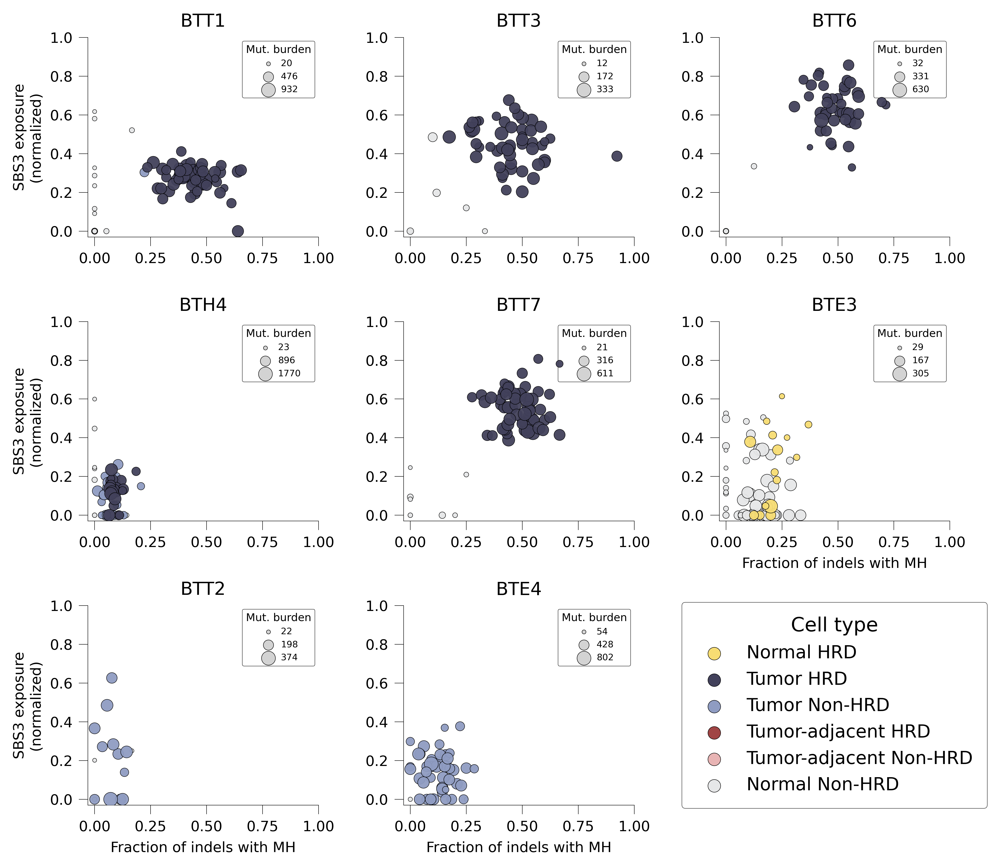

Saved combined figure to: ../output/Fig6_scNanoSeq_HRD_classification/SBS3_ID_plots/combined_HRDdel_vs_SBS3_A4.pdf


In [14]:
# ---- Combined multi-panel figure (3x3 on A4) --------------------------------
import math

COMBINED_SAMPLES = ["BTT1", "BTT3", "BTT6", "BTH4", "BTT7", "BTE3", "BTT2", "BTE4"]
N_ROWS, N_COLS = 3, 3

# A4 in inches (portrait): 8.27 x 11.69
A4_W, A4_H = 8, 7

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(A4_W, A4_H))
axes_flat = axes.flatten()

_zorder = {
    "Normal Non-HRD": 1, "Normal HRD": 20,
    "Tumor-adjacent Non-HRD": 10, "Tumor-adjacent HRD": 15,
    "Tumor Non-HRD": 5, "Tumor HRD": 11,
}

LEGEND_TITLE_FS = 6
LEGEND_LABEL_FS = 5
FRAME_LW        = 0.25

for idx, sample in enumerate(COMBINED_SAMPLES):
    ax = axes_flat[idx]
    display_sample = sample_id_map.get(sample, sample)

    sample_pred = HRD_predictions[HRD_predictions["sample"] == sample]
    hrd_cells   = set(sample_pred.loc[sample_pred["prob_HRDetect_high"] > HRD_THRESHOLD, "cell"])
    if sample == "BTE3":
        hrd_cells = {_pad_bte3_cell(c) for c in hrd_cells}

    id_cells_in_sample = [c for c in ID_count_matrix.index
                          if c.startswith(f"{display_sample}_")]
    cells = (pd.Index(id_cells_in_sample)
               .intersection(SNV_exposures.columns)
               .intersection(SNV_count_matrix.columns))
    if len(cells) == 0:
        ax.set_title(f"{display_sample} (no data)", fontsize=9)
        ax.set_xlim(-0.03, 1); ax.set_ylim(-0.03, 1)
        ax.tick_params(axis="both", labelsize=7)
        continue

    ID_sub  = ID_count_matrix.loc[cells]
    SNV_sub = SNV_count_matrix[cells]
    EXP_sub = SNV_exposures[cells]

    id_totals = ID_sub.sum(axis=1)
    x_frac    = (ID_sub[HRD_DELETION_ROWS].sum(axis=1) / id_totals).fillna(0)

    exp_totals = EXP_sub.sum(axis=0)
    y_frac     = (EXP_sub.loc["SBS3"] / exp_totals).fillna(0)

    burdens = SNV_sub.sum(axis=0) + id_totals
    bmin, bmax = burdens.min(), burdens.max()
    if bmax > bmin:
        sizes = SIZE_MIN + (SIZE_MAX - SIZE_MIN) * (burdens - bmin) / (bmax - bmin)
    else:
        sizes = pd.Series(SIZE_MIN, index=burdens.index)

    categories = pd.Series(
        {c: classify_cell(c, hrd_cells, tumor_set, adjacent_set) for c in cells},
        index=cells,
    )

    for category, color in COLOR_MAP.items():
        m = (categories == category)
        if not m.any():
            continue
        ax.scatter(
            x_frac[m].values, y_frac[m].values,
            s=sizes[m].values, color=color,
            edgecolor="black", linewidth=DOT_EDGE_LW, alpha=0.95,
            zorder=_zorder[category],
        )

    ax.set_xlim(-0.03, 1)
    ax.set_ylim(-0.03, 1)
    ax.set_title(display_sample, fontsize=10)
    ax.tick_params(axis="both", labelsize=8)

    row, col = divmod(idx, N_COLS)
    if row == N_ROWS - 1 or (row == N_ROWS - 2 and idx + N_COLS >= len(COMBINED_SAMPLES)):
        ax.set_xlabel("Fraction of indels with MH", fontsize=8)
    if col == 0:
        ax.set_ylabel("SBS3 exposure\n(normalized)", fontsize=8)

    # ----- Per-panel mutation burden legend (top-right, inside axes) --------
    size_keys = [round(bmin), round((bmin + bmax) / 2), round(bmax)]
    size_handles = [
        plt.scatter([], [], s=SIZE_MIN,                  color="lightgrey",
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=str(size_keys[0])),
        plt.scatter([], [], s=(SIZE_MIN + SIZE_MAX) / 2, color="lightgrey",
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=str(size_keys[1])),
        plt.scatter([], [], s=SIZE_MAX,                  color="lightgrey",
                    edgecolor="black", linewidth=DOT_EDGE_LW, label=str(size_keys[2])),
    ]
    leg_burden = ax.legend(
        handles=size_handles,
        title="Mut. burden",
        title_fontsize=LEGEND_TITLE_FS,
        fontsize=LEGEND_LABEL_FS,
        loc="upper right",
        frameon=True, fancybox=True, borderpad=0.4, labelspacing=0.5,
        handletextpad=0.4, borderaxespad=0.4,
    )
    leg_burden.get_frame().set_linewidth(FRAME_LW)
    leg_burden.get_frame().set_edgecolor("black")

# Hide any unused axes (the 9th cell)
for j in range(len(COMBINED_SAMPLES), N_ROWS * N_COLS):
    axes_flat[j].axis("off")

# ----- Shared cell-type legend in the empty 9th panel ------------------------
legend_ax = axes_flat[-1]
legend_ax.axis("off")

type_handles = [
    plt.scatter([], [], s=50, color=color,
                edgecolor="black", linewidth=DOT_EDGE_LW, label=label)
    for label, color in COLOR_MAP.items()
]

leg_type = legend_ax.legend(
    handles=type_handles,
    title="Cell type",
    title_fontsize=11,
    fontsize=10,
    loc="center",
    frameon=True, fancybox=True, borderpad=0.8,
)
leg_type.get_frame().set_linewidth(FRAME_LW)
leg_type.get_frame().set_edgecolor("black")

plt.tight_layout()

combined_out_path = os.path.join(PLOT_OUTDIR, "combined_HRDdel_vs_SBS3_A4.pdf")
plt.savefig(combined_out_path, format="pdf", bbox_inches="tight")
plt.show()
plt.close(fig)
print(f"Saved combined figure to: {combined_out_path}")

## 9. Summary statistics

In [15]:
n_total = len(scNanoSeq_prob_df)

# Per-burden-regime thresholds (from the table above, paper-recommended)
# Cells in low burden -> low threshold; cells in high burden -> high threshold.
# Choose ONE threshold for the headline number and report the table for the rest.
HEADLINE_THRESHOLD = 0.50

n_high_50  = int((scNanoSeq_prob_df["prob_HRDetect_high"] >= 0.50).sum())
n_high_62  = int((scNanoSeq_prob_df["prob_HRDetect_high"] >= 0.62).sum())  # ~mid-burden FPR=0.02
n_high_42  = int((scNanoSeq_prob_df["prob_HRDetect_high"] >= 0.42).sum())  # ~low-burden FPR=0.02

print(f"Random Forest: n_estimators=100, random_state=41, features={len(FEATURE_COLS)}")
print(f"Training set: {labeled_matrix.shape[0]} synthetic samples; "
      f"{int((labeled_matrix['HRDetect_binary']==1).sum())} HRDetect-high, "
      f"{int((labeled_matrix['HRDetect_binary']==0).sum())} HRDetect low/mid")
print(f"10-fold CV accuracy: {cv_accuracy.mean():.4f} +/- {cv_accuracy.std():.4f}")
print()
print(f"scNanoSeq cells scored: {n_total}")
print(f"  classified HRDetect-high at p >= 0.50: {n_high_50}  ({n_high_50/n_total:.1%})")
print(f"  classified HRDetect-high at p >= 0.62 (mid-burden FPR=0.02): {n_high_62}  ({n_high_62/n_total:.1%})")
print(f"  classified HRDetect-high at p >= 0.42 (low-burden  FPR=0.02): {n_high_42}  ({n_high_42/n_total:.1%})")
print()
print("Per-ratio operating points (FPR=0.02):")
print(threshold_table.to_string(index=False))


Random Forest: n_estimators=100, random_state=41, features=179
Training set: 15435 synthetic samples; 5733 HRDetect-high, 9702 HRDetect low/mid
10-fold CV accuracy: 0.9189 +/- 0.0282

scNanoSeq cells scored: 804
  classified HRDetect-high at p >= 0.50: 359  (44.7%)
  classified HRDetect-high at p >= 0.62 (mid-burden FPR=0.02): 323  (40.2%)
  classified HRDetect-high at p >= 0.42 (low-burden  FPR=0.02): 399  (49.6%)

Per-ratio operating points (FPR=0.02):
 downsampling_ratio      AUC  TPR_at_FPR0.02  threshold_at_FPR0.02  n_samples
                 10 0.992951        0.924298                  0.66       2205
                 20 0.989910        0.891331                  0.61       2205
                 30 0.983834        0.875458                  0.59       1470
                 40 0.985652        0.844322                  0.63       1470
                 50 0.984738        0.847985                  0.59       1470
                100 0.975229        0.809524                  0.50       

# 11. Trees

In [16]:
import pandas as pd
from Bio import Phylo
import matplotlib.pyplot as plt
import colorsys
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [17]:
def transform_cell_name(cell_name):
    if cell_name.startswith("BT3_"):
        cell_suffix = cell_name[6:]
        cell_suffix = cell_suffix.zfill(3)  # Ensures at least 3 characters with leading zeros
        return "BT3" + '_sc'+cell_suffix  # Returns the modified cell name
    return cell_name  # Returns original if condition is not met

In [18]:
hrdscout_tresh=0.7

In [19]:
metadata = pd.read_csv('data/Fig6_scNanoSeq_HRD_classification/sample_ID_mapping_dg_annot_tumor_cells.txt', sep=',', index_col=0)
metadata_fn='data/Fig6_scNanoSeq_HRD_classification/sample_ID_mapping.txt'
snames_df = pd.read_csv(metadata_fn, sep='\t')
metadata_m = pd.merge(metadata, snames_df, left_on='Sample_ID_internal', right_on='Sample_ID_internal')
metadata.head(1)

,Sample_ID_internal,Type,Truncal.node,Early.tumor.remnant.cell,Diploid.cells.filtered.out.,Note,no_tumor_cells,tumor_cells
Sample_ID_ms,,,,,,,,
BTE1,BT36,ER+,29,BT36_sc013,NaN,there are two distinct subclones; the paper an...,18,BT36_sc024;BT36_sc010;BT36_sc004;BT36_sc020;BT...


In [20]:
cell_hrdetect_df = pd.read_csv("data/Fig6_scNanoSeq_HRD_classification/HRD_predictions.csv").set_index("cell")
cell_hrdetect_df["sample"] = cell_hrdetect_df.index.str.split("_").str[0]

metadata_v2 = metadata_m.drop(columns=['Truncal.node', 'no_tumor_cells', 'tumor_cells'])

# here we strictly assume there is one MRCA node
mrca_nodes = {}
mrca_nodes['BTE1'] = 'Node12'
mrca_nodes['BTE2'] = 'Node12'
mrca_nodes['BTE3'] = 'Node58'
mrca_nodes['BTE4'] = 'Node9'
mrca_nodes['BTE5'] = 'Node4'
mrca_nodes['BTE6'] = 'Node16' #
mrca_nodes['BTE7'] = 'Node6' #
mrca_nodes['BTH1'] = 'Node18'
mrca_nodes['BTH2'] = 'Node22'
mrca_nodes['BTH3'] = 'Node12'
mrca_nodes['BTH4'] = 'Node52'
mrca_nodes['BTH5'] = 'Node8'#
mrca_nodes['BTH6'] = 'Node12' #
mrca_nodes['BTH7'] = 'Node10'
mrca_nodes['BTT1'] = 'Node70' #
mrca_nodes['BTT2'] = 'Node6' #
mrca_nodes['BTT3'] = 'Node52' #
mrca_nodes['BTT4'] = 'Node63' #
mrca_nodes['BTT5'] = 'Node34' #
mrca_nodes['BTT6'] = 'Node45' #
mrca_nodes['BTT7'] = 'Node62' #

# cells that would be classified as normal according to the tree, but I suggest they are not counted as normal 
# samples with remnant cells: BTH2
# samples with remnant cells: BTH4, BTH5

normal_cell_blacklist = ['BT3_sc63', # very high mutation burden
                         # BTE7 has a very low number of mutaions, and tmb(normal)>tmb(tumor)
                         'BT23_sc321', 'BT23_sc308', 'BT23_sc318', 'BT23_sc304', 'BT23_sc316',
                         'BT30_sc321',
                         'BT27_sc012', 'BT27_sc006', 'BT27_sc007', 'BT27_sc011', # remnant cells
                        'BT20_sc005',
                         'BT32_sc006', 'BT32_sc020', 'BT32_sc011',
                         'BT6_sc001', 'BT6_sc016', 'BT6_sc046','BT6_sc033'
                        ]

remnant_cells = ['BT3_sc51', 'BT3_sc6',
                'BTH30_sc321', 
                'BT27_sc011', 'BT27_sc007', 'BT27_sc006', 'BT27_sc012',
                'BT20_sc005',
                'BT6_sc033', 'BT6_sc001', 'BT6_sc016', 'BT6_sc046',
                'BT17_sc023', 'BT17_sc204'
                ]

BT36 BTE1
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


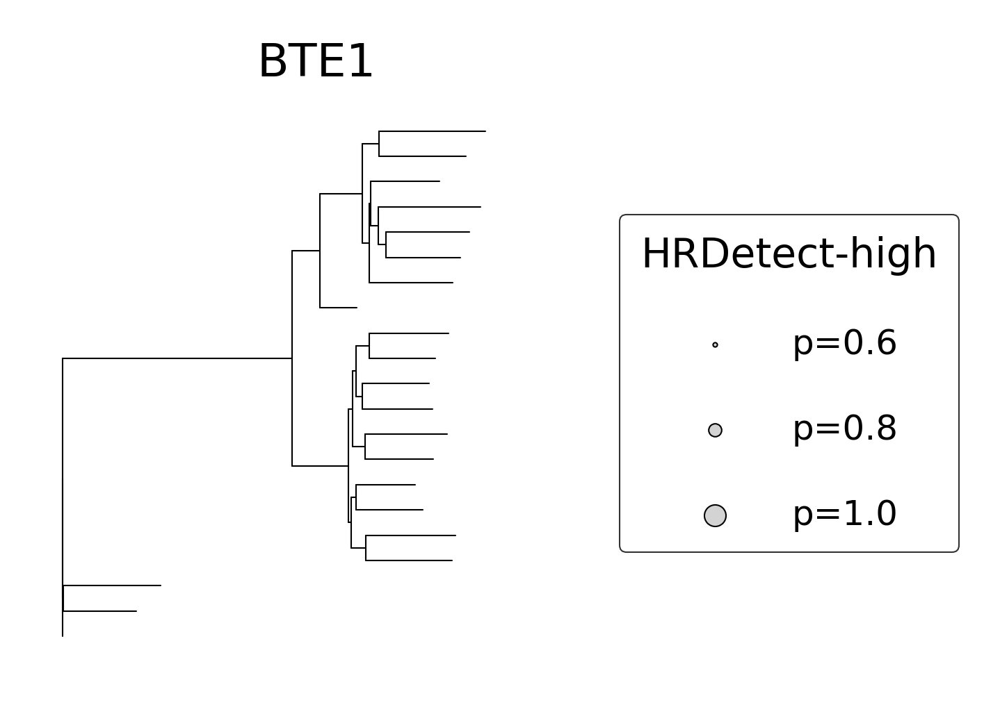

BT2 BTE2
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 2}


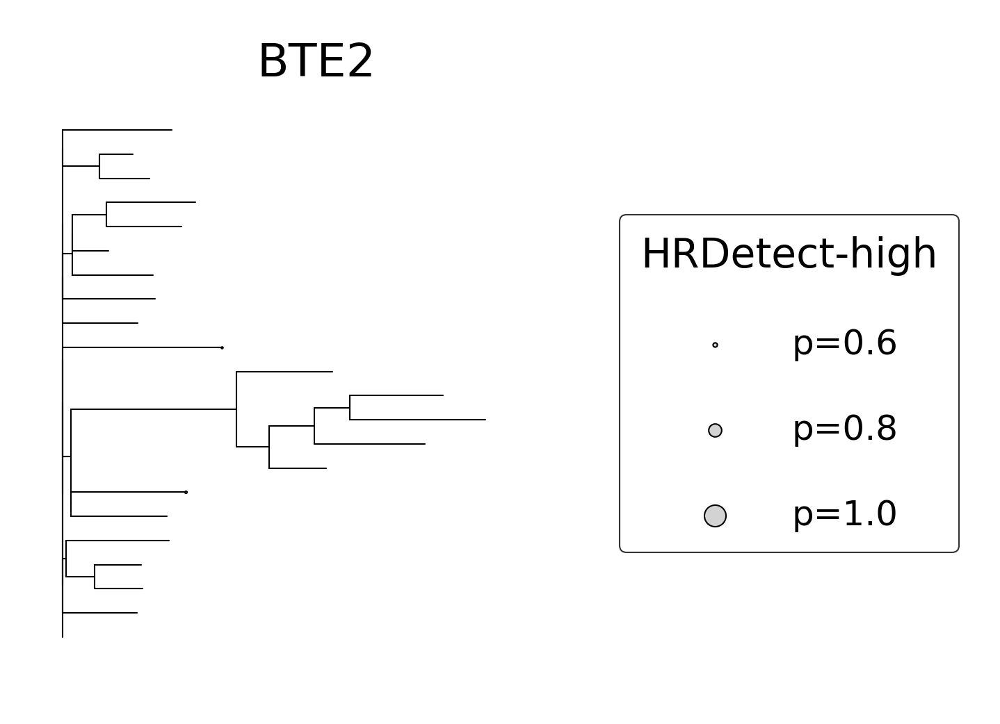

BT3 BTE3
  drew: {'tumor': 1, 'adjacent': 0, 'normal': 14}


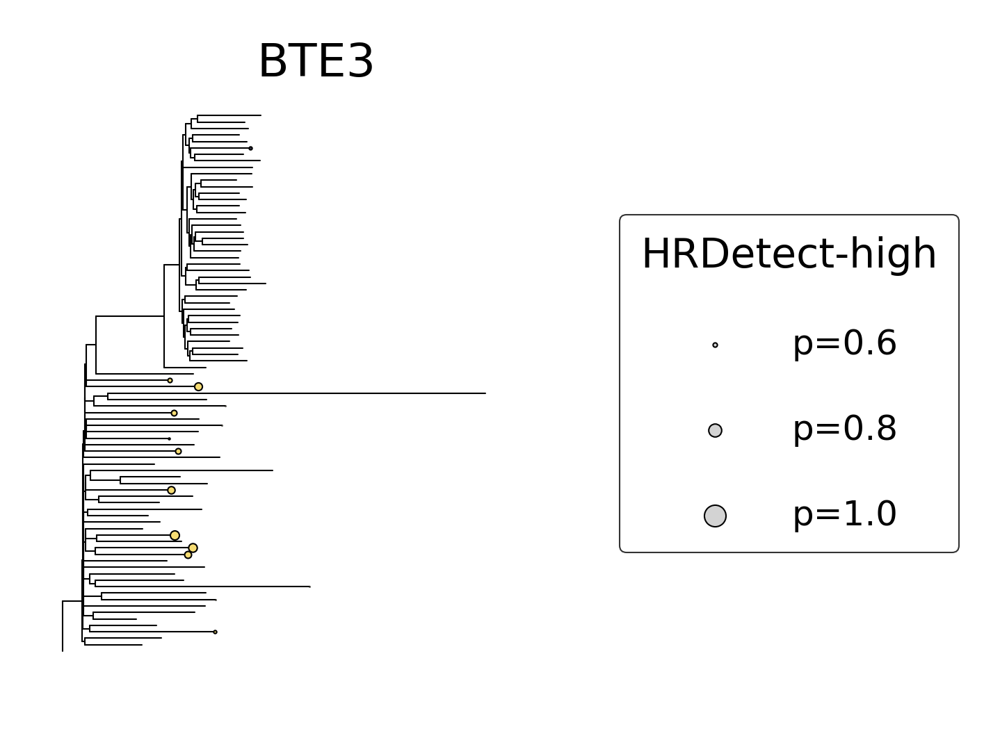

BT34 BTE4
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


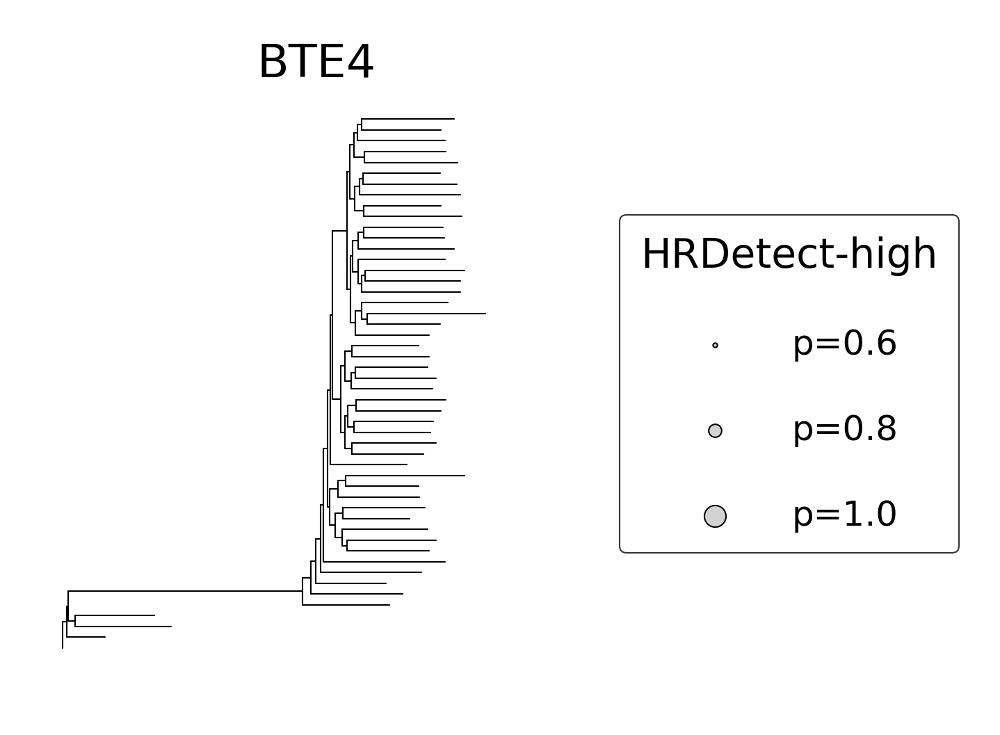

BT37 BTE5
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


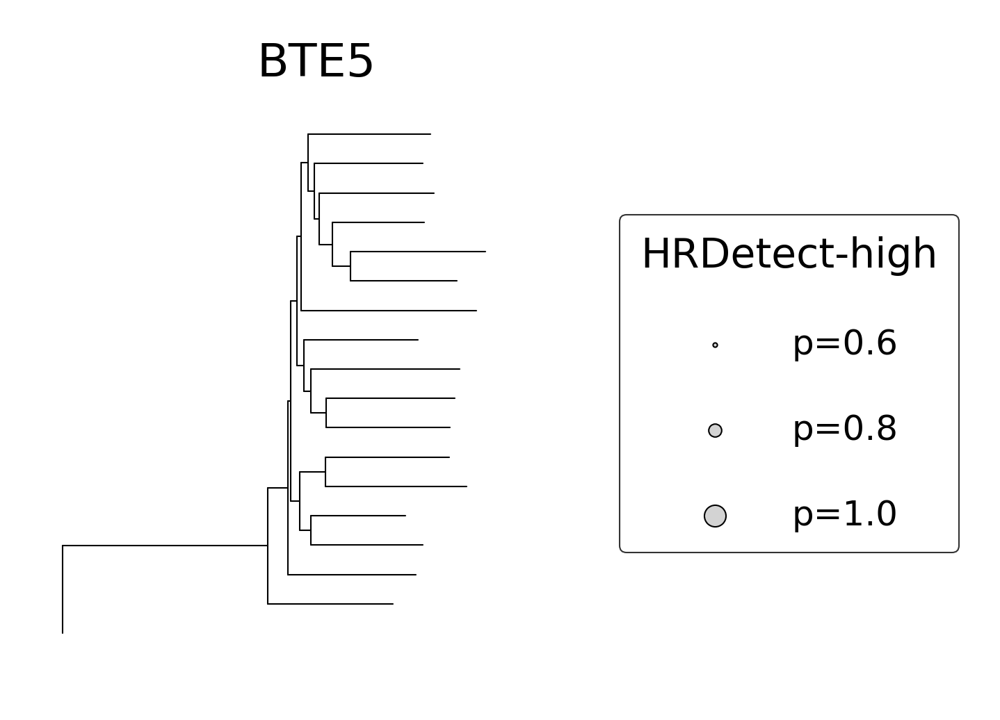

BT12 BTE6
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


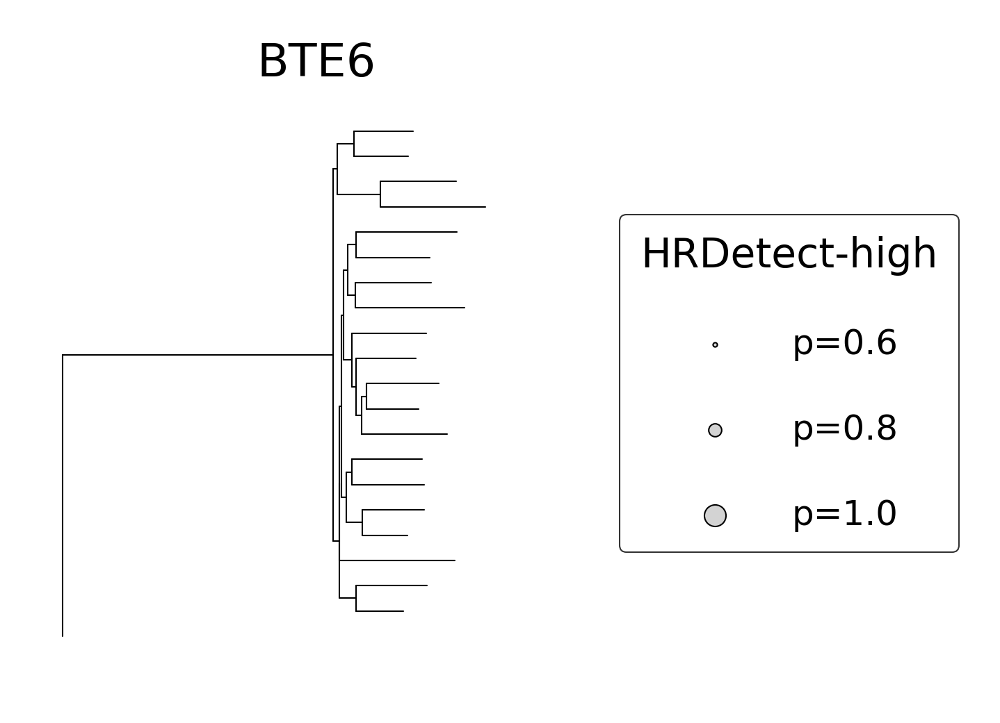

BT23 BTE7
  drew: {'tumor': 1, 'adjacent': 0, 'normal': 0}


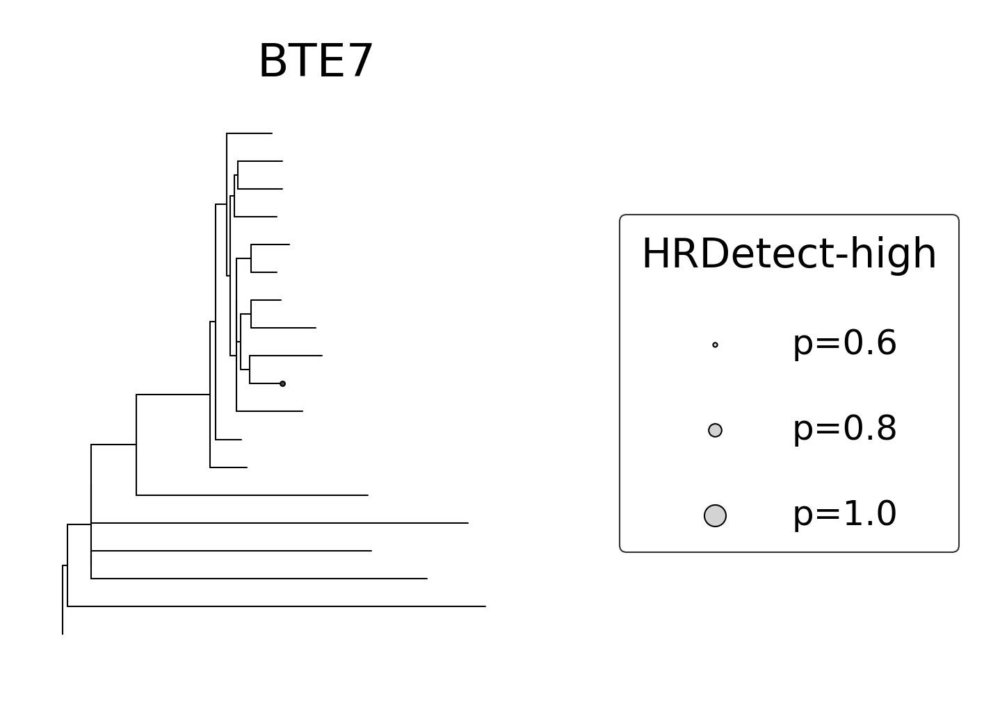

BT30 BTH1
  drew: {'tumor': 2, 'adjacent': 1, 'normal': 0}


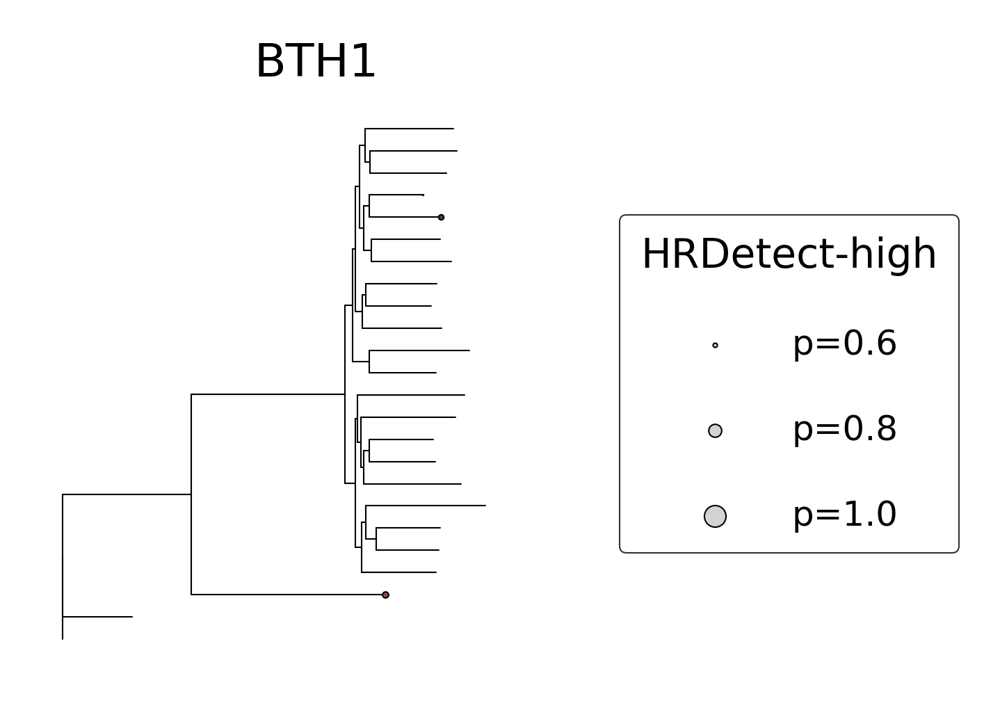

BT27 BTH2
  drew: {'tumor': 12, 'adjacent': 4, 'normal': 0}


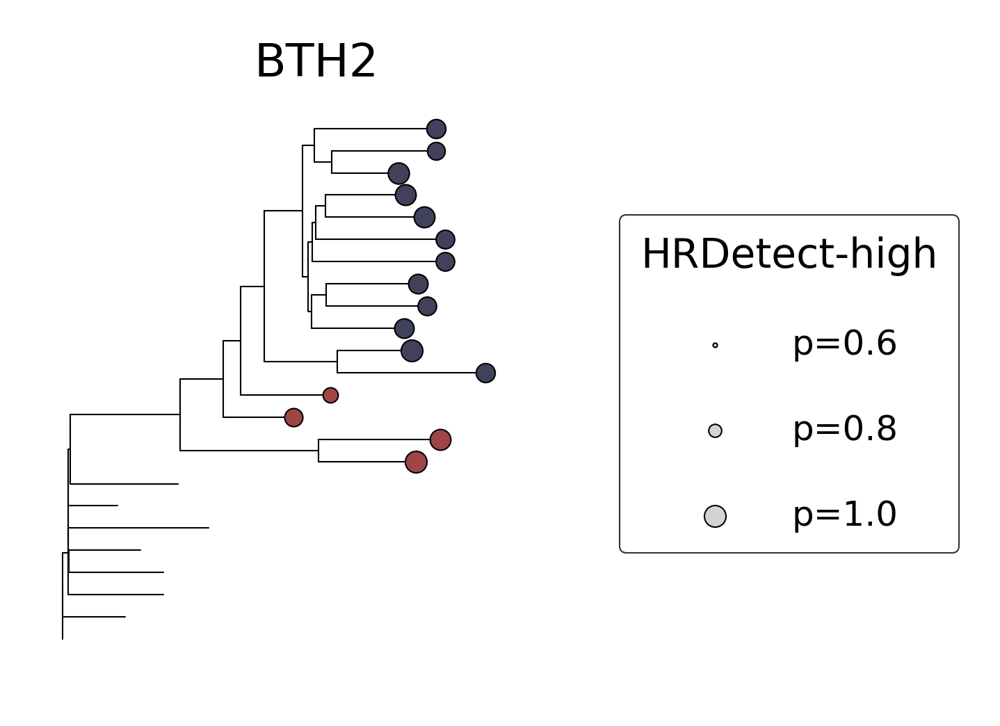

BT21 BTH3
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


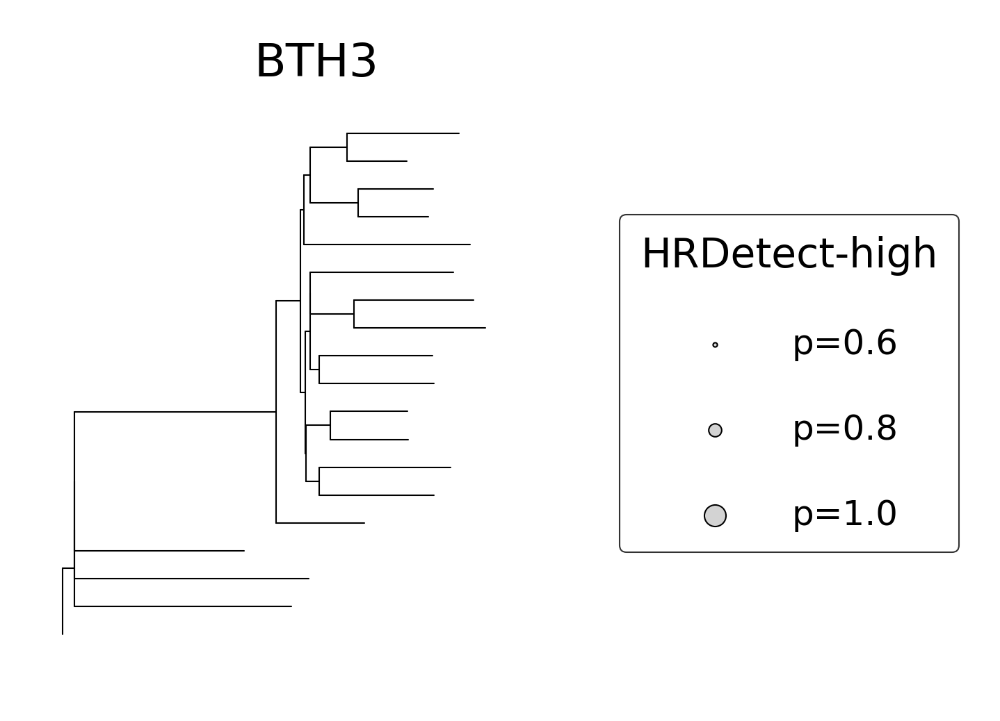

BT20 BTH4
  drew: {'tumor': 26, 'adjacent': 0, 'normal': 0}


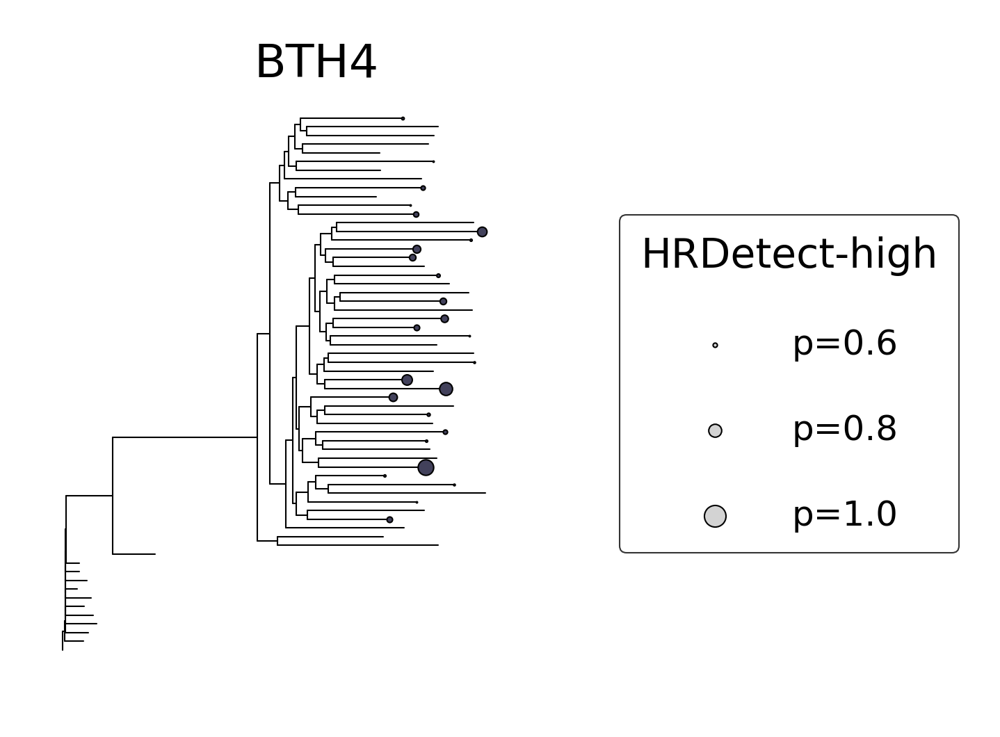

BT32 BTH5
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


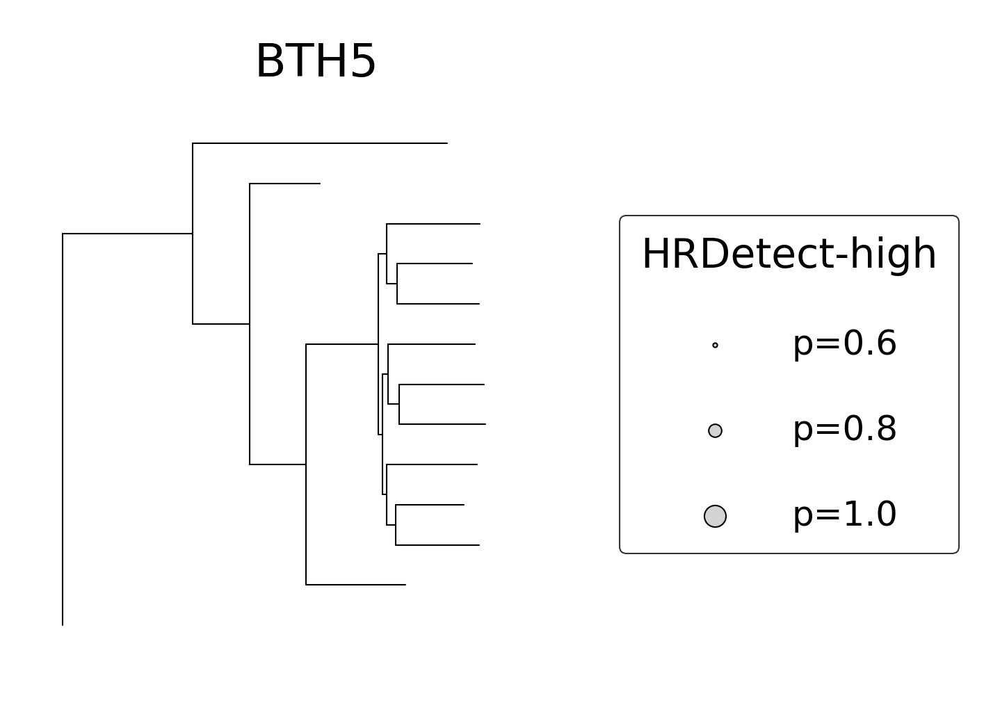

BT39 BTH6
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


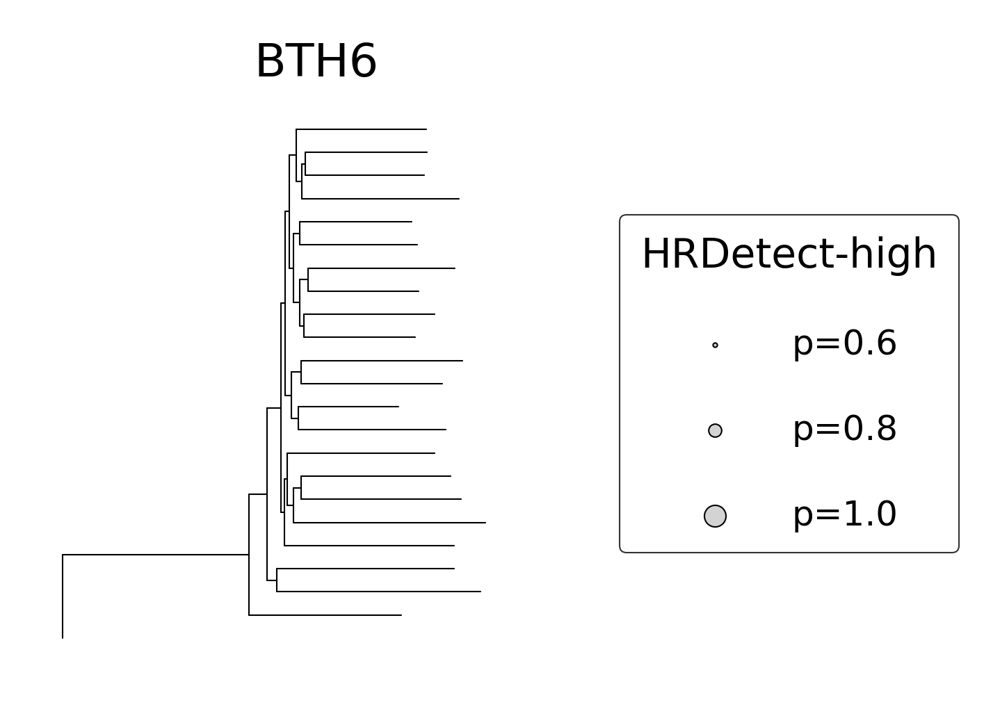

BT33 BTH7
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


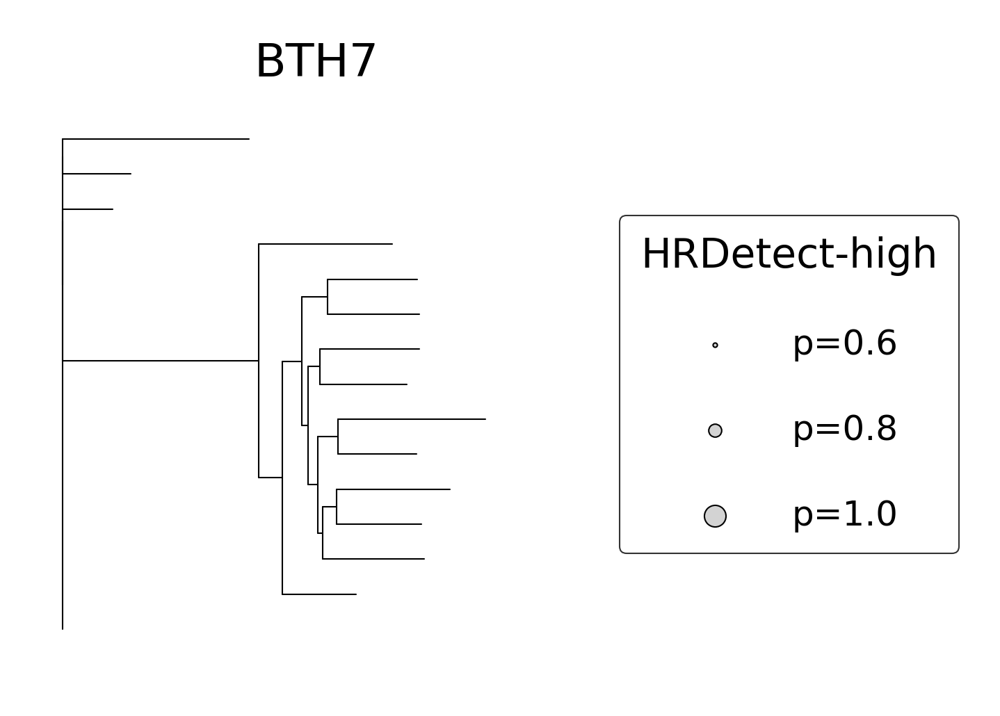

BT5 BTT1
  drew: {'tumor': 59, 'adjacent': 0, 'normal': 0}


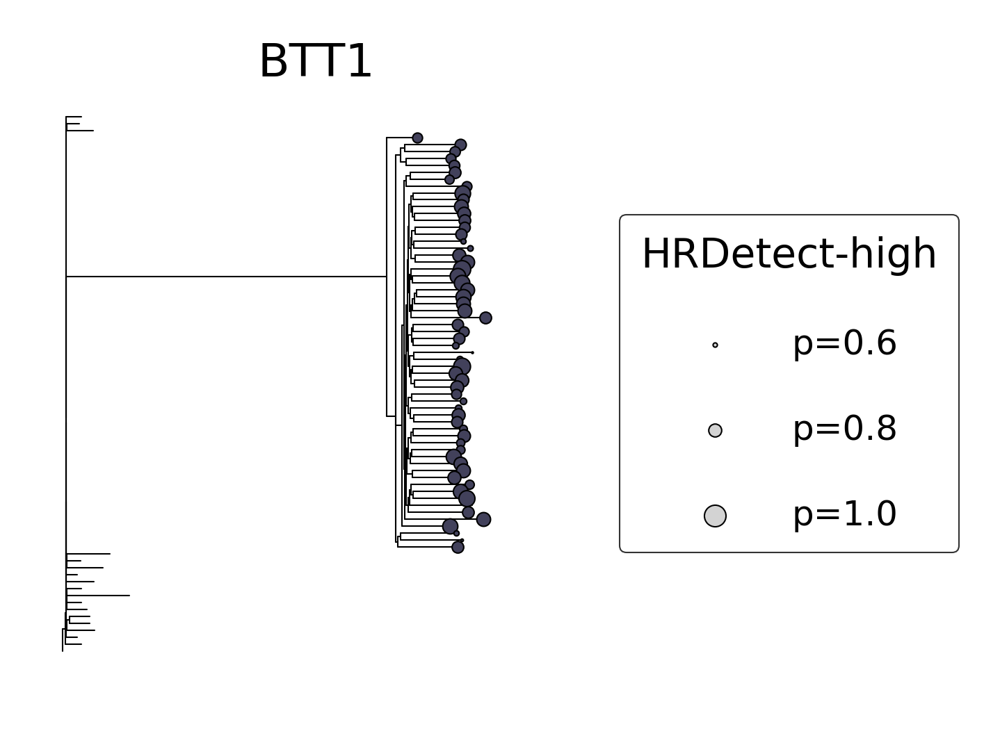

BT13 BTT2
  drew: {'tumor': 0, 'adjacent': 0, 'normal': 0}


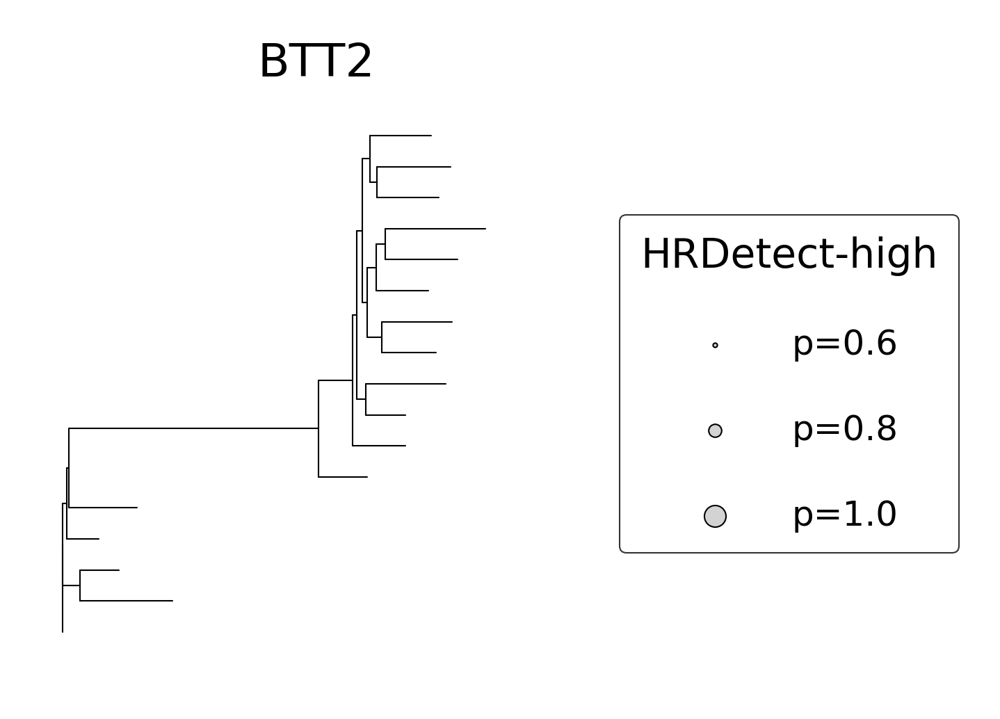

BT18 BTT3
  drew: {'tumor': 50, 'adjacent': 0, 'normal': 0}


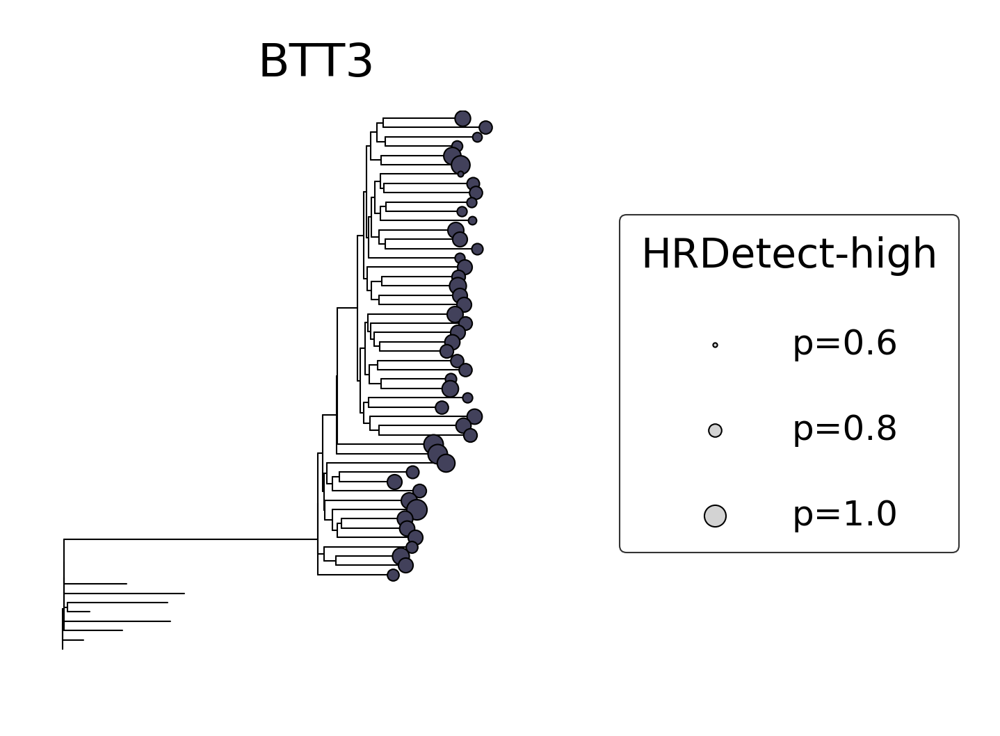

BT6 BTT4


  drew: {'tumor': 56, 'adjacent': 1, 'normal': 3}


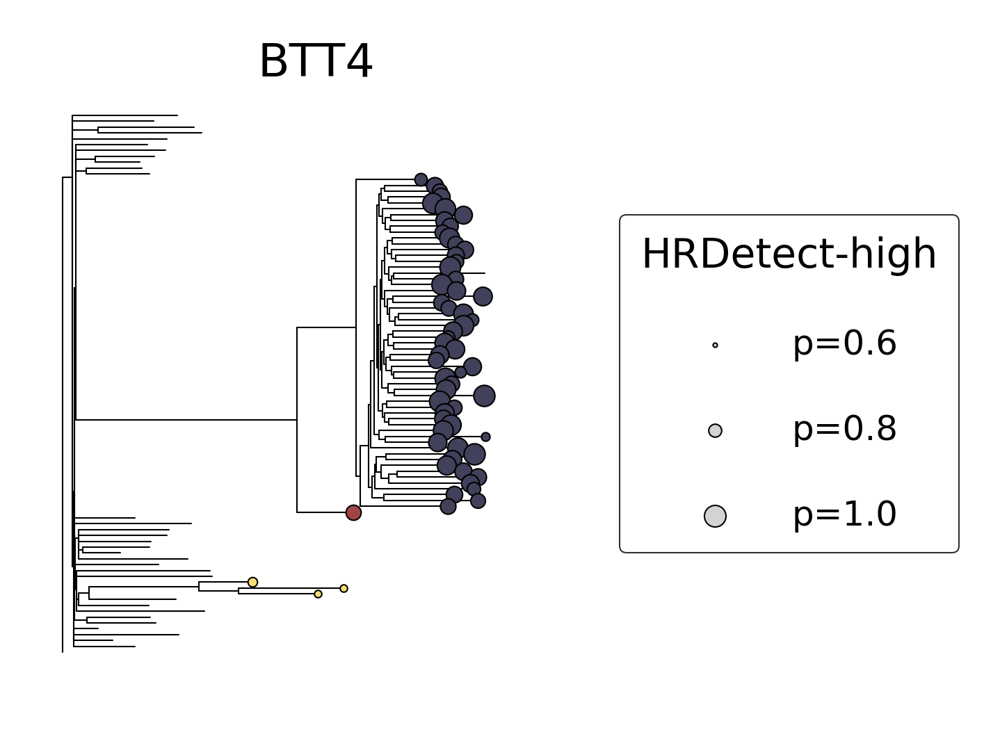

BT17 BTT5
  drew: {'tumor': 19, 'adjacent': 2, 'normal': 0}


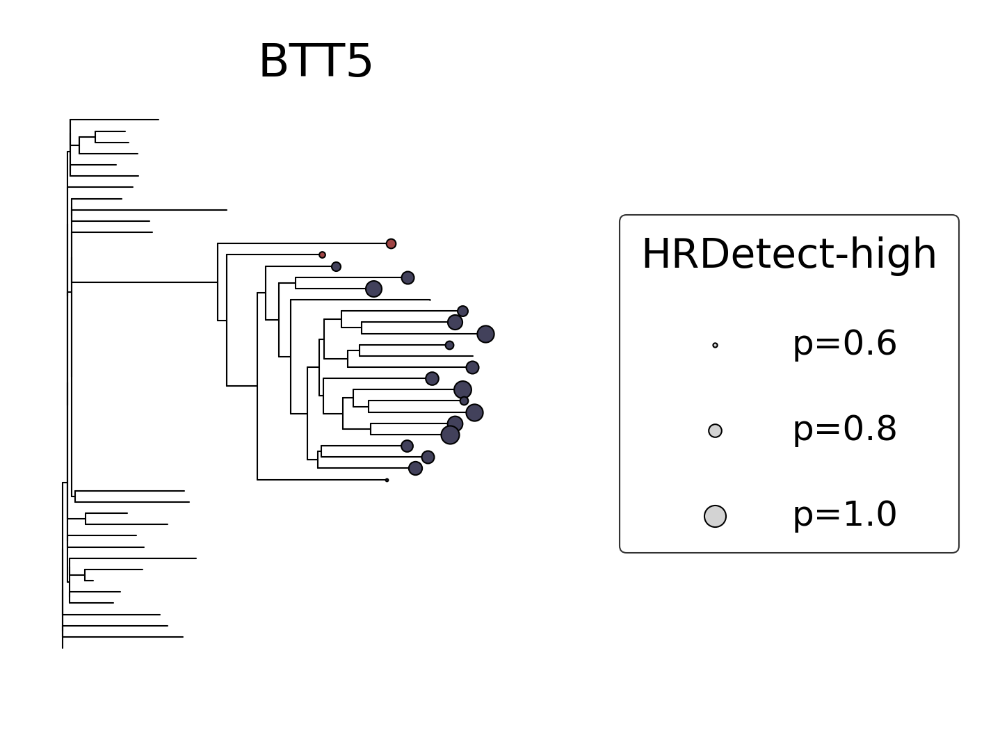

BT14 BTT6
  drew: {'tumor': 42, 'adjacent': 0, 'normal': 0}


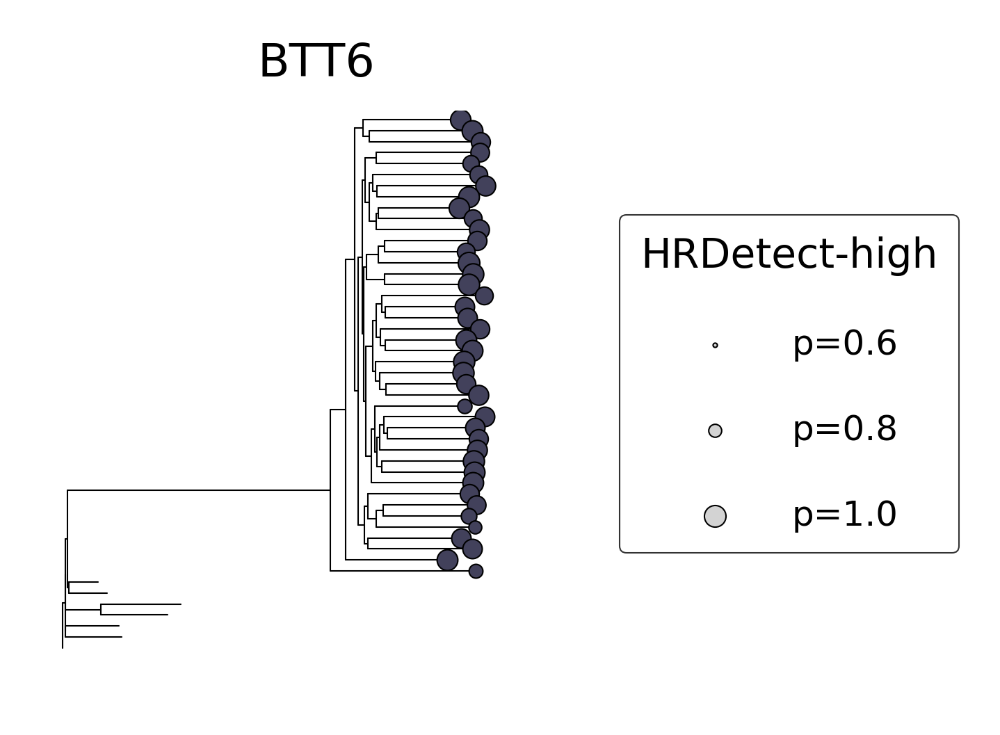

BT16 BTT7


  drew: {'tumor': 58, 'adjacent': 0, 'normal': 0}


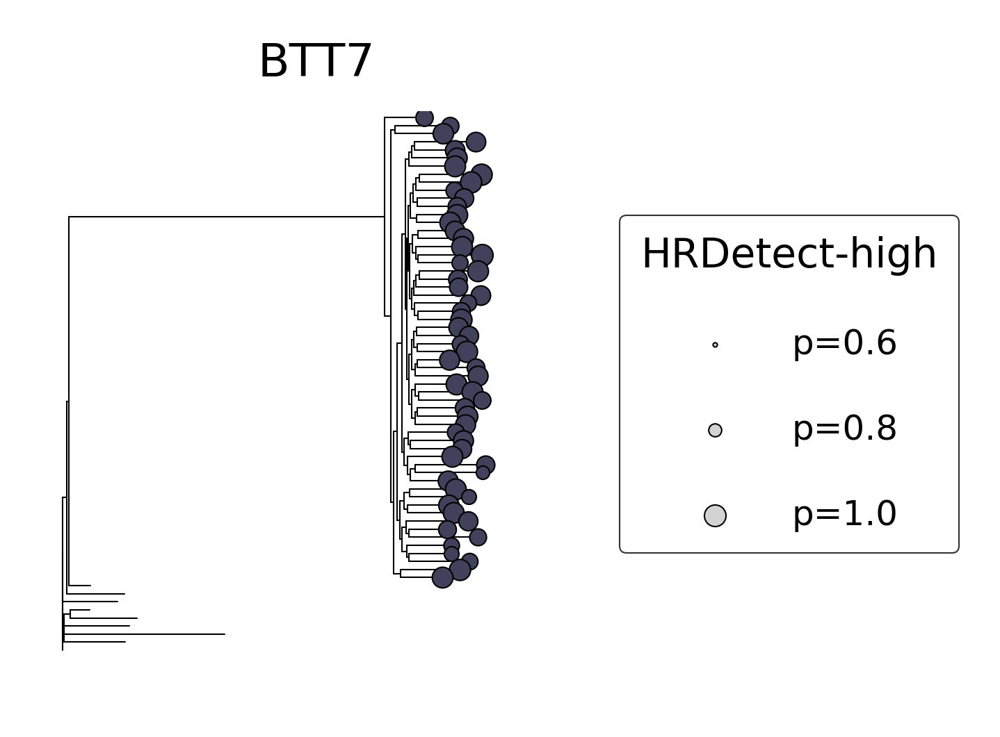

In [21]:
import os

# ---- Style constants (matched to dot-grid figure) ----------------------------
TUMOR_DOT_COLOR        = "#42415b"
ADJACENT_DOT_COLOR     = "#a04545"
NORMAL_DOT_COLOR       = "#f7dd73"
TREE_LW                = 0.25
DOT_EDGE_LW            = 0.25
HRD_THRESHOLD          = 0.50
DOT_SIZE_SCALE         = 5

TREE_OUTDIR = os.path.join("../output/Fig6_scNanoSeq_HRD_classification", "trees")
os.makedirs(TREE_OUTDIR, exist_ok=True)

# ---- Tumor-adjacent cells (display-name format) -----------------------------
tumor_adjacent_cells_list = [
    'BTH1_sc321', 'BTH2_sc006', 'BTH2_sc007', 'BTH2_sc011', 'BTH2_sc012',
    'BTT4_sc033', 'BTT5_sc023', 'BTT5_sc204',
]
adjacent_set = set(tumor_adjacent_cells_list)

# ---- Build the SAME prob lookup the dot-grid uses ---------------------------
_prob_lookup = {}
for _, r in scNanoSeq_prob_df.iterrows():
    parts = r["cell"].split("_", 1)
    disp  = sample_id_map.get(parts[0], parts[0]) + "_" + parts[1]
    _prob_lookup[disp] = r["prob_HRDetect_high"]


def _to_display(cell_name, sample_internal, sample_ms):
    if cell_name == "normal_bulk":
        return cell_name
    return cell_name.replace(sample_internal, sample_ms, 1)


def _leaf_positions(tree):
    """Replicates Phylo.draw's internal x/y layout, returns {clade: (x, y)} for terminals."""
    x_posns = tree.depths()
    if not max(x_posns.values()):
        x_posns = tree.depths(unit_branch_lengths=True)

    terminals = tree.get_terminals()
    # Phylo.draw assigns y = 1 to the first terminal (top) and increases downward,
    # then flips the axis. So index 0 -> y=1, index 1 -> y=2, etc.
    y_posns = {tip: i + 1 for i, tip in enumerate(terminals)}

    def _calc_internal(clade):
        for sub in clade.clades:
            if sub not in y_posns:
                _calc_internal(sub)
        if clade.clades:
            y_posns[clade] = (y_posns[clade.clades[0]] + y_posns[clade.clades[-1]]) / 2.0
    _calc_internal(tree.root)

    return {c: (x_posns[c], y_posns[c]) for c in terminals}


# ---- Storage -----------------------------------------------------------------
all_distances = {}
tumor_cells_per_sample = {}
non_tumor_cells_per_sample = {}
tumor_cells_per_sample_standardized = {}
non_tumor_cells_per_sample_standardized = {}
remnant_cells_per_sample = {}
additional_truncal_nodes = {}


for _, row in metadata_m.iterrows():
    s_int, s_ms = row['Sample_ID_internal'], row['Sample_ID_ms']
    print(s_int, s_ms)

    atree_fn = f"data/Fig6_scNanoSeq_HRD_classification/trees_n21_Feb25/{s_int}.raxml.mutationMapTree"
    tree2 = Phylo.read(atree_fn, 'newick')

    if any(c.name == 'normal_bulk' for c in tree2.get_terminals()):
        tree2.root_with_outgroup('normal_bulk')

    if s_ms not in mrca_nodes:
        continue

    # ---- MRCA / tumor / non-tumor partition ---------------------------------
    path_nodes = tree2.get_path(mrca_nodes[s_ms])
    additional_truncal_nodes[s_ms] = [n.name for n in path_nodes]

    mrca_clade = tree2.find_any(name=mrca_nodes[s_ms])
    tumor_cells = mrca_clade.get_terminals()
    tumor_cell_names = set(d.name for d in tumor_cells)
    tumor_cells_per_sample[s_ms] = list(tumor_cell_names)
    tumor_cells_per_sample_standardized[s_ms] = [transform_cell_name(n) for n in tumor_cell_names]

    all_leaves = set(tree2.get_terminals())
    non_tumor_cells = all_leaves - set(tumor_cells)
    non_tumor_cell_names = [d.name for d in non_tumor_cells if d.name != 'normal_bulk']
    non_tumor_cells_per_sample[s_ms] = non_tumor_cell_names
    non_tumor_cells_per_sample_standardized[s_ms] = [transform_cell_name(n) for n in non_tumor_cell_names]

    remnant_cells_per_sample[s_ms] = [c for c in remnant_cells if c.split('_')[0] == s_int]

    for t in tumor_cells:
        d_root = tree2.distance(tree2.root, t)
        d_mrca = tree2.distance(tree2.root, mrca_clade)
        all_distances[t.name] = {
            'sample': s_int,
            'ms_cell_name': s_ms + '_' + t.name.split('_')[-1],
            'd_root': d_root,
            'd_mrca': d_mrca / d_root if d_root else 0,
            'd_post_mrca': (d_root - d_mrca) / d_root if d_root else 0,
        }

    # ---- Draw tree ----------------------------------------------------------
    mpl.rcParams['lines.linewidth'] = TREE_LW
    fig, ax = plt.subplots(figsize=(1.7, 1.7))

    Phylo.draw(
        tree2, do_show=False, branch_labels=None,
        label_func=lambda c: "",
        axes=ax, show_confidence=False,
    )
    for line in ax.get_lines():
        line.set_linewidth(TREE_LW)

    # ---- Leaf positions via layout (NOT via ax.texts) -----------------------
    leaf_pos = _leaf_positions(tree2)

    # ---- Overlay HRDetect dots ----------------------------------------------
    n_drawn = {"tumor": 0, "adjacent": 0, "normal": 0}
    for clade in tree2.get_terminals():
        if clade.name == 'normal_bulk':
            continue
        disp = _to_display(clade.name, s_int, s_ms)
        prob = _prob_lookup.get(disp)
        if prob is None or prob <= HRD_THRESHOLD:
            continue

        if disp in adjacent_set:
            color, cat = ADJACENT_DOT_COLOR, "adjacent"
        elif clade.name in tumor_cell_names:
            color, cat = TUMOR_DOT_COLOR, "tumor"
        else:
            color, cat = NORMAL_DOT_COLOR, "normal"

        size = (((prob - 0.5) / 0.3) ** 2) * DOT_SIZE_SCALE
        x, y = leaf_pos[clade]
        ax.scatter(x, y, s=size, color=color,
                   edgecolor="black", linewidth=DOT_EDGE_LW, zorder=3)
        n_drawn[cat] += 1
    print(f"  drew: {n_drawn}")

            # ---- Legend: dot size vs HRDetect probability ---------------------------
    legend_probs = [0.6, 0.8, 1.0]
    legend_handles = [
        plt.scatter([], [], s=(((p - 0.5) / 0.3) ** 2) * DOT_SIZE_SCALE,
                    color="lightgrey", edgecolor="black",
                    linewidth=DOT_EDGE_LW, label=f"p={p:.1f}")
        for p in legend_probs
    ]
    leg = ax.legend(
        handles=legend_handles,
        title="HRDetect-high",
        loc="center left", bbox_to_anchor=(1.02, 0.5),
        fontsize=6, title_fontsize=7,
        frameon=True, fancybox=True, borderpad=0.6,
        labelspacing=1.5,
        handletextpad=1.2,
    )
    leg.get_frame().set_linewidth(0.25)
    leg.get_frame().set_edgecolor("black")

    ax.set_title(s_ms, fontsize=8)
    ax.axis('off')

    out = os.path.join(TREE_OUTDIR, f"{s_ms}_{s_int}_tree.pdf")
    plt.savefig(out, format='pdf', bbox_inches='tight')
    plt.show()
    plt.close(fig)